In [112]:
import pandas as pd
import numpy as np
import random
from tqdm import tqdm
from skrebate import ReliefF
import xgboost as xgb
import os
from itertools import combinations
from scipy.special import comb
from deap import base, creator, tools, algorithms
from matplotlib.dates import DateFormatter, AutoDateLocator
import matplotlib.pyplot as plt # Standard python libraries for data and visualisation

# Import models
import sklearn
from sklearn.linear_model import Ridge, Lasso

# Import data munging tools
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.linear_model import Ridge, Lasso
from scipy.stats import bernoulli
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_classif, chi2, mutual_info_classif
from sklearn.metrics import make_scorer
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import mutual_info_regression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS
from sklearn.tree import DecisionTreeRegressor

random.seed(42) # set the random seed for reproducibility
np.random.seed(42) # fix the randomness numbers for the reproducibility


In [113]:
# download production data file
csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Production Data/Cement/cemex/cemex_csv_file/cemex_quarter_report_up_to_2024_version_1.csv' 
production_df = pd.read_csv(csv_file)

# download general index data
S_P_500_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/S_P_500.csv'
Russell_2000_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Russell_2000.csv'
NASDAQ_Composite_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/NASDAQ_Composite.csv'
Dow_jones_industrial_average_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Dow_jones_industrial_average.csv'

S_P_500_df = pd.read_csv(S_P_500_csv_file)
Russell_2000_df = pd.read_csv(Russell_2000_csv_file)
NASDAQ_Composite_df = pd.read_csv(NASDAQ_Composite_csv_file)
Dow_jones_industrial_average_df = pd.read_csv(Dow_jones_industrial_average_csv_file)

# download market index future
Nasdaq_100_Sep_24_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Nasdaq_100_Sep_24.csv'
E_mini_Russell_2000_Index_Future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/E_mini_Russell_2000_Index_Future.csv'
E_Mini_S_P_500_Sep_24_Future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/E_Mini_S_P_500_Sep_24_Future.csv'
Mini_Dow_Jones_Indus_future_Sep_24_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Mini_Dow_Jones_Indus_future_Sep_24.csv'
US_Treasury_Bond_Futures_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/US_Treasury_Bond_Futures.csv'

Nasdaq_100_Sep_24_df = pd.read_csv(Nasdaq_100_Sep_24_csv_file)
E_mini_Russell_2000_Index_Future_df = pd.read_csv(E_mini_Russell_2000_Index_Future_csv_file) # 2017-07-10
E_Mini_S_P_500_Sep_24_Future_df = pd.read_csv(E_Mini_S_P_500_Sep_24_Future_csv_file) # 2000-09-18
Mini_Dow_Jones_Indus_future_Sep_24_df = pd.read_csv(Mini_Dow_Jones_Indus_future_Sep_24_csv_file) # 2002-04-05
US_Treasury_Bond_Futures_df = pd.read_csv(US_Treasury_Bond_Futures_csv_file) # 2000-09-21

# download energy futures
oil_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Crude_Oil_Jul_24.csv'
brent_oil_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Brent Crude Oil Last Day Financ.csv'
Copper_Sep_24_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Copper_Sep_24.csv'
Corn_Futures_Dec_2024_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Corn_Futures_Dec_2024_future.csv'
Cotton_Oct_24_Futures_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Cotton_Oct_24_Futures.csv'
Sugar_Futures_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Sugar_Futures.csv'
Soybean_Oil_Futures_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Soybean_Oil_Futures_future.csv'
Soybean_Futures_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Soybean_Futures_future.csv'
silver_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/silver_future.csv'
RBOB_Gasoline_Aug_24_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/RBOB_Gasoline_Aug_24_future.csv'
Platinum_Oct_24_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Platinum_Oct_24_future.csv'
Palladium_Sep_24_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Palladium_Sep_24_future.csv'
Orange_Juice_Sep_24_Futures_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Orange_Juice_Sep_24_Futures.csv'
Natural_Gas_Aug_24_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Natural_Gas_Aug_24.csv'
Heating_Oil_Aug_24_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Heating_Oil_Aug_24_future.csv'
Gold_Aug_24_Future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Gold_Aug_24_Future.csv'

oil_csv_df = pd.read_csv(oil_csv_file)
brent_oil_future_df = pd.read_csv(brent_oil_csv_file)
Copper_Sep_24_df = pd.read_csv(Copper_Sep_24_csv_file)
Corn_Futures_Dec_2024_future_df = pd.read_csv(Corn_Futures_Dec_2024_future_csv_file)
Cotton_Oct_24_Futures_df = pd.read_csv(Cotton_Oct_24_Futures_csv_file)
Sugar_Futures_df = pd.read_csv(Sugar_Futures_csv_file)
Soybean_Oil_Futures_future_df = pd.read_csv(Soybean_Oil_Futures_future_csv_file)
Soybean_Futures_future_df = pd.read_csv(Soybean_Futures_future_csv_file)
silver_future_df = pd.read_csv(silver_future_csv_file)
RBOB_Gasoline_Aug_24_future_df = pd.read_csv(RBOB_Gasoline_Aug_24_future_csv_file)
Platinum_Oct_24_future_df = pd.read_csv(Platinum_Oct_24_future_csv_file)
Palladium_Sep_24_future_df = pd.read_csv(Palladium_Sep_24_future_csv_file)
Orange_Juice_Sep_24_Futures_df = pd.read_csv(Orange_Juice_Sep_24_Futures_csv_file)
Natural_Gas_Aug_24_df = pd.read_csv(Natural_Gas_Aug_24_csv_file)
Heating_Oil_Aug_24_future_df = pd.read_csv(Heating_Oil_Aug_24_future_csv_file)
Gold_Aug_24_Future_df = pd.read_csv(Gold_Aug_24_Future_csv_file)

# download etf futures


# download energy etf
Alerian_MLP_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/Alerian_MLP_ETF.csv'
Fidelity_MSCI_Energy_Index_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/Fidelity_MSCI_Energy_Index_ETF.csv'
First_Trust_North_American_Energy_Infrastructure_Fund_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/First_Trust_North_American_Energy_Infrastructure_Fund_ETF.csv'
Global_X_MLP_Energy_Infrastructure_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/Global_X_MLP_Energy_Infrastructure_ETF.csv'
Global_X_MLP_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/Global_X_MLP_ETF.csv'
iShares_Global_Clean_Energy_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/iShares_Global_Clean_Energy_ETF.csv'
iShares_Global_Energy_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/iShares_Global_Energy_ETF.csv'
MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs.csv'
SPDR_S_P_Oil_Gas_Exploration_Production_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/SPDR_S_P_Oil_Gas_Exploration_Production_ETF.csv'
The_Energy_Select_Sector_SPDR_Fund_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/The_Energy_Select_Sector_SPDR_Fund_ETF.csv'
VanEck_Oil_Services_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/VanEck_Oil_Services_ETF.csv'
Vanguard_Energy_Index_Fund_ETF_Shares_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/Vanguard_Energy_Index_Fund_ETF_Shares_ETF.csv'

Alerian_MLP_ETF_df = pd.read_csv(Alerian_MLP_ETF_csv_file)
Fidelity_MSCI_Energy_Index_ETF_df = pd.read_csv(Fidelity_MSCI_Energy_Index_ETF_csv_file)
First_Trust_North_American_Energy_Infrastructure_Fund_ETF_df = pd.read_csv(First_Trust_North_American_Energy_Infrastructure_Fund_ETF_csv_file)
Global_X_MLP_Energy_Infrastructure_ETF_df = pd.read_csv(Global_X_MLP_Energy_Infrastructure_ETF_csv_file)
Global_X_MLP_ETF_df = pd.read_csv(Global_X_MLP_ETF_csv_file)
iShares_Global_Clean_Energy_ETF_df = pd.read_csv(iShares_Global_Clean_Energy_ETF_csv_file)
MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs_df = pd.read_csv(MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs_csv_file)
SPDR_S_P_Oil_Gas_Exploration_Production_ETF_df = pd.read_csv(SPDR_S_P_Oil_Gas_Exploration_Production_ETF_csv_file)
The_Energy_Select_Sector_SPDR_Fund_ETF_df = pd.read_csv(The_Energy_Select_Sector_SPDR_Fund_ETF_csv_file)
VanEck_Oil_Services_ETF_df = pd.read_csv(VanEck_Oil_Services_ETF_csv_file)
Vanguard_Energy_Index_Fund_ETF_Shares_ETF_df = pd.read_csv(Vanguard_Energy_Index_Fund_ETF_Shares_ETF_csv_file)


# download real estate etf
Dimensional_Global_Real_Estate_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Dimensional_Global_Real_Estate_ETF.csv'
Dimensional_US_Real_Estate_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Dimensional_US_Real_Estate_ETF.csv'
Fidelity_MSCI_Real_Estate_Index_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Fidelity_MSCI_Real_Estate_Index_ETF.csv'
Invesco_Active_US_Real_Estate_Fund_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Invesco_Active_US_Real_Estate_Fund_ETF.csv'
iShares_Cohen_Steers_REIT_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/iShares_Cohen_Steers_REIT_ETF.csv'

iShares_Residential_and_Multisector_Real_Estate_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/iShares_Residential_and_Multisector_Real_Estate_ETF.csv'
iShares_Trust_iShares_Core_US_REIT_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/iShares_Trust_iShares_Core_US_REIT_ETF.csv'
iShares_U_S_Real_Estate_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/iShares_U_S_Real_Estate_ETF.csv'
JPMorgan_BetaBuilders_MSCI_US_REIT_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/JPMorgan_BetaBuilders_MSCI_US_REIT_ETF.csv'

Vanguard_Real_Estate_Index_Fund_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Vanguard_Real_Estate_Index_Fund_ETF.csv'
Schwab_U_S_REIT_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Schwab_U_S_REIT_ETF.csv'
The_Real_Estate_Select_Sector_SPDR_Fund_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/The_Real_Estate_Select_Sector_SPDR_Fund_ETF.csv'
SPDR_Dow_Jones_REIT_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/SPDR_Dow_Jones_REIT_ETF.csv'

Dimensional_Global_Real_Estate_ETF_df = pd.read_csv(Dimensional_Global_Real_Estate_ETF_csv_file)
Dimensional_US_Real_Estate_ETF_df = pd.read_csv(Dimensional_US_Real_Estate_ETF_csv_file)
Fidelity_MSCI_Real_Estate_Index_ETF_df = pd.read_csv(Fidelity_MSCI_Real_Estate_Index_ETF_csv_file)
Invesco_Active_US_Real_Estate_Fund_ETF_df = pd.read_csv(Invesco_Active_US_Real_Estate_Fund_ETF_csv_file)
iShares_Cohen_Steers_REIT_ETF_df = pd.read_csv(iShares_Cohen_Steers_REIT_ETF_csv_file)
iShares_Residential_and_Multisector_Real_Estate_ETF_df = pd.read_csv(iShares_Residential_and_Multisector_Real_Estate_ETF_csv_file)
iShares_Trust_iShares_Core_US_REIT_ETF_df = pd.read_csv(iShares_Trust_iShares_Core_US_REIT_ETF_csv_file)
iShares_U_S_Real_Estate_ETF_df = pd.read_csv(iShares_U_S_Real_Estate_ETF_csv_file)
JPMorgan_BetaBuilders_MSCI_US_REIT_ETF_df = pd.read_csv(JPMorgan_BetaBuilders_MSCI_US_REIT_ETF_csv_file)
Vanguard_Real_Estate_Index_Fund_ETF_df = pd.read_csv(Vanguard_Real_Estate_Index_Fund_ETF_csv_file)
Schwab_U_S_REIT_ETF_df = pd.read_csv(Schwab_U_S_REIT_ETF_csv_file)
The_Real_Estate_Select_Sector_SPDR_Fund_ETF_df = pd.read_csv(The_Real_Estate_Select_Sector_SPDR_Fund_ETF_csv_file)
SPDR_Dow_Jones_REIT_ETF_df = pd.read_csv(SPDR_Dow_Jones_REIT_ETF_csv_file)

# other related etf
VanEck_Steel_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/VanEck_Steel_ETF.csv'
First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF.csv'
Invesco_Russell_2000_Dynamic_Multifactor_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Invesco_Russell_2000_Dynamic_Multifactor_ETF.csv'
Invesco_S_P_SmallCap_Value_with_Momentum_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Invesco_S_P_SmallCap_Value_with_Momentum_ETF.csv'
iShares_MSCI_South_Africa_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/iShares_MSCI_South_Africa_ETF.csv'

VanEck_Steel_ETF_df = pd.read_csv(VanEck_Steel_ETF_csv_file)
First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF_df = pd.read_csv(First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF_csv_file)
Invesco_Russell_2000_Dynamic_Multifactor_ETF_df = pd.read_csv(Invesco_Russell_2000_Dynamic_Multifactor_ETF_csv_file)
Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df = pd.read_csv(Invesco_S_P_SmallCap_Value_with_Momentum_ETF_csv_file)
iShares_MSCI_South_Africa_ETF_df = pd.read_csv(iShares_MSCI_South_Africa_ETF_csv_file)

In [114]:
carbon_future_csv_file = "/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/carbon/Carbon Emissions Futures Historical Data.csv"
carbon_future_df = pd.read_csv(carbon_future_csv_file)
carbon_future_df['Date'] = pd.to_datetime(carbon_future_df['Date'], format='%m/%d/%Y') # convert the "Date" column to datetime format
carbon_future_df.rename(columns={"Price": "Adj Close"}, inplace=True) # rename the "Price" column to "Adj Close"
carbon_future_df = carbon_future_df.sort_values(by='Date') # sort the DataFrame by the "Date" column in ascending order
carbon_future_df.reset_index(drop=True, inplace=True) # reset the index after sorting
print(carbon_future_df)

           Date  Adj Close   Open   High    Low    Vol. Change %
0    2005-04-25      17.55  17.55  17.55  17.55     NaN    3.54%
1    2005-04-26      17.20  17.20  17.20  17.20     NaN   -1.99%
2    2005-04-27      16.45  16.45  16.45  16.45     NaN   -4.36%
3    2005-04-28      16.00  16.00  16.00  16.00     NaN   -2.74%
4    2005-04-29      16.50  16.50  16.50  16.50     NaN    3.13%
...         ...        ...    ...    ...    ...     ...      ...
4985 2024-07-16      67.94  67.85  68.27  67.16  18.32K    0.53%
4986 2024-07-17      66.42  68.01  68.13  66.41  19.67K   -2.24%
4987 2024-07-18      66.11  66.43  66.98  66.01  17.93K   -0.47%
4988 2024-07-19      66.00  66.35  67.49  65.73  15.46K   -0.17%
4989 2024-07-22      64.79  66.28  66.73  64.25  25.44K   -1.83%

[4990 rows x 7 columns]


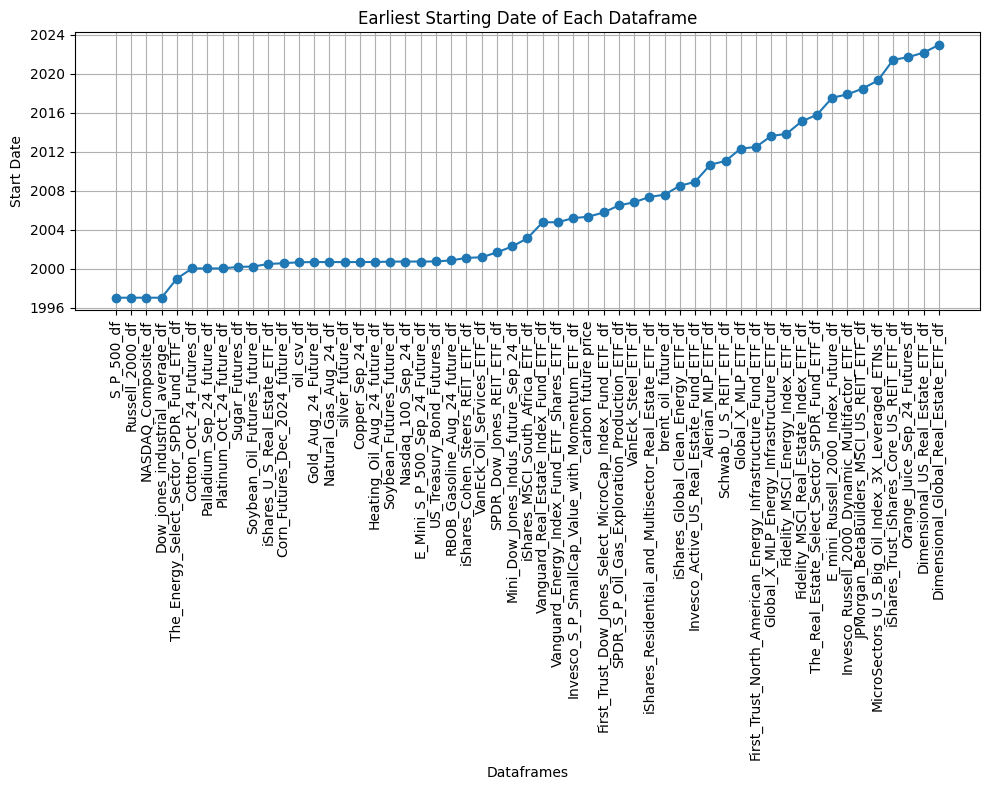

                                    Dataframe Start Date
0                                  S_P_500_df 1997-01-02
1                             Russell_2000_df 1997-01-02
2                         NASDAQ_Composite_df 1997-01-02
3             Dow_jones_industrial_average_df 1997-01-02
4                        Nasdaq_100_Sep_24_df 2000-09-18
5             E_Mini_S_P_500_Sep_24_Future_df 2000-09-18
6                 US_Treasury_Bond_Futures_df 2000-09-21
7                                  oil_csv_df 2000-08-23
8                            Copper_Sep_24_df 2000-08-30
9             Corn_Futures_Dec_2024_future_df 2000-07-17
10                   Cotton_Oct_24_Futures_df 2000-01-03
11                           Sugar_Futures_df 2000-03-01
12              Soybean_Oil_Futures_future_df 2000-03-15
13                  Soybean_Futures_future_df 2000-09-15
14                           silver_future_df 2000-08-30
15             RBOB_Gasoline_Aug_24_future_df 2000-11-01
16                  Platinum_Oc

In [115]:
import pandas as pd
import matplotlib.pyplot as plt

# Dictionary of dataframes with their variable names
dfs = {
    'S_P_500_df': S_P_500_df,
    'Russell_2000_df': Russell_2000_df, 'NASDAQ_Composite_df': NASDAQ_Composite_df,
    'Dow_jones_industrial_average_df': Dow_jones_industrial_average_df, 'Nasdaq_100_Sep_24_df': Nasdaq_100_Sep_24_df,
    'E_mini_Russell_2000_Index_Future_df': E_mini_Russell_2000_Index_Future_df, 'E_Mini_S_P_500_Sep_24_Future_df': E_Mini_S_P_500_Sep_24_Future_df,
    'Mini_Dow_Jones_Indus_future_Sep_24_df': Mini_Dow_Jones_Indus_future_Sep_24_df, 'US_Treasury_Bond_Futures_df': US_Treasury_Bond_Futures_df,
    'oil_csv_df': oil_csv_df, 'brent_oil_future_df': brent_oil_future_df, 'Copper_Sep_24_df': Copper_Sep_24_df,
    'Corn_Futures_Dec_2024_future_df': Corn_Futures_Dec_2024_future_df, 'Cotton_Oct_24_Futures_df': Cotton_Oct_24_Futures_df,
    'Sugar_Futures_df': Sugar_Futures_df, 'Soybean_Oil_Futures_future_df': Soybean_Oil_Futures_future_df,
    'Soybean_Futures_future_df': Soybean_Futures_future_df, 'silver_future_df': silver_future_df,
    'RBOB_Gasoline_Aug_24_future_df': RBOB_Gasoline_Aug_24_future_df, 'Platinum_Oct_24_future_df': Platinum_Oct_24_future_df,
    'Palladium_Sep_24_future_df': Palladium_Sep_24_future_df, 'Orange_Juice_Sep_24_Futures_df': Orange_Juice_Sep_24_Futures_df,
    'Natural_Gas_Aug_24_df': Natural_Gas_Aug_24_df, 'Heating_Oil_Aug_24_future_df': Heating_Oil_Aug_24_future_df,
    'Gold_Aug_24_Future_df': Gold_Aug_24_Future_df, 'Alerian_MLP_ETF_df': Alerian_MLP_ETF_df,
    'Fidelity_MSCI_Energy_Index_ETF_df': Fidelity_MSCI_Energy_Index_ETF_df, 'First_Trust_North_American_Energy_Infrastructure_Fund_ETF_df': First_Trust_North_American_Energy_Infrastructure_Fund_ETF_df,
    'Global_X_MLP_Energy_Infrastructure_ETF_df': Global_X_MLP_Energy_Infrastructure_ETF_df, 'Global_X_MLP_ETF_df': Global_X_MLP_ETF_df,
    'iShares_Global_Clean_Energy_ETF_df': iShares_Global_Clean_Energy_ETF_df, 'MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs_df': MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs_df,
    'SPDR_S_P_Oil_Gas_Exploration_Production_ETF_df': SPDR_S_P_Oil_Gas_Exploration_Production_ETF_df, 'The_Energy_Select_Sector_SPDR_Fund_ETF_df': The_Energy_Select_Sector_SPDR_Fund_ETF_df,
    'VanEck_Oil_Services_ETF_df': VanEck_Oil_Services_ETF_df, 'Vanguard_Energy_Index_Fund_ETF_Shares_ETF_df': Vanguard_Energy_Index_Fund_ETF_Shares_ETF_df,
    'Dimensional_Global_Real_Estate_ETF_df': Dimensional_Global_Real_Estate_ETF_df, 'Dimensional_US_Real_Estate_ETF_df': Dimensional_US_Real_Estate_ETF_df,
    'Fidelity_MSCI_Real_Estate_Index_ETF_df': Fidelity_MSCI_Real_Estate_Index_ETF_df, 'Invesco_Active_US_Real_Estate_Fund_ETF_df': Invesco_Active_US_Real_Estate_Fund_ETF_df,
    'iShares_Cohen_Steers_REIT_ETF_df': iShares_Cohen_Steers_REIT_ETF_df, 'iShares_Residential_and_Multisector_Real_Estate_ETF_df': iShares_Residential_and_Multisector_Real_Estate_ETF_df,
    'iShares_Trust_iShares_Core_US_REIT_ETF_df': iShares_Trust_iShares_Core_US_REIT_ETF_df, 'iShares_U_S_Real_Estate_ETF_df': iShares_U_S_Real_Estate_ETF_df,
    'JPMorgan_BetaBuilders_MSCI_US_REIT_ETF_df': JPMorgan_BetaBuilders_MSCI_US_REIT_ETF_df, 'Vanguard_Real_Estate_Index_Fund_ETF_df': Vanguard_Real_Estate_Index_Fund_ETF_df,
    'Schwab_U_S_REIT_ETF_df': Schwab_U_S_REIT_ETF_df, 'The_Real_Estate_Select_Sector_SPDR_Fund_ETF_df': The_Real_Estate_Select_Sector_SPDR_Fund_ETF_df,
    'SPDR_Dow_Jones_REIT_ETF_df': SPDR_Dow_Jones_REIT_ETF_df, 'VanEck_Steel_ETF_df': VanEck_Steel_ETF_df,
    'First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF_df': First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF_df,
    'Invesco_Russell_2000_Dynamic_Multifactor_ETF_df': Invesco_Russell_2000_Dynamic_Multifactor_ETF_df,
    'Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df': Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df,
    'iShares_MSCI_South_Africa_ETF_df': iShares_MSCI_South_Africa_ETF_df,
    'carbon future price': carbon_future_df
}

# Extract the earliest date from each dataframe
start_dates = []
names = []
filtered_dfs = []

# Set the criterion date
criterion_date = pd.to_datetime('2000-12-31')
user_defined_starting_points = ['carbon future price']  # Add more assets as needed
for name, df in dfs.items():
    if not df.empty:
        start_date = pd.to_datetime(df['Date'].iloc[0])
        start_dates.append(start_date)
        names.append(name)
        # Check if the start date is before the criterion date or matches any user-defined starting point
        if start_date < criterion_date or name in user_defined_starting_points:
            filtered_dfs.append(df)

start_dates_df = pd.DataFrame({'Dataframe': names, 'Start Date': start_dates}) # create a new dataframe with the starting dates
start_dates_df = start_dates_df.sort_values(by='Start Date') # sort by start date

plt.figure(figsize=(10, 8))
plt.plot(start_dates_df['Dataframe'], start_dates_df['Start Date'], marker='o')
plt.xticks(rotation=90)
plt.xlabel('Dataframes')
plt.ylabel('Start Date')
plt.title('Earliest Starting Date of Each Dataframe')
plt.grid(True)
plt.tight_layout()
plt.show()

# Display the filtered dataframes' names and their start dates
filtered_dfs_names_dates = [(names[i], start_dates[i]) for i, df in enumerate(dfs.values()) if start_dates[i] < criterion_date or names[i] in user_defined_starting_points]
filtered_dfs_names_dates_df = pd.DataFrame(filtered_dfs_names_dates, columns=['Dataframe', 'Start Date'])
print(filtered_dfs_names_dates_df)


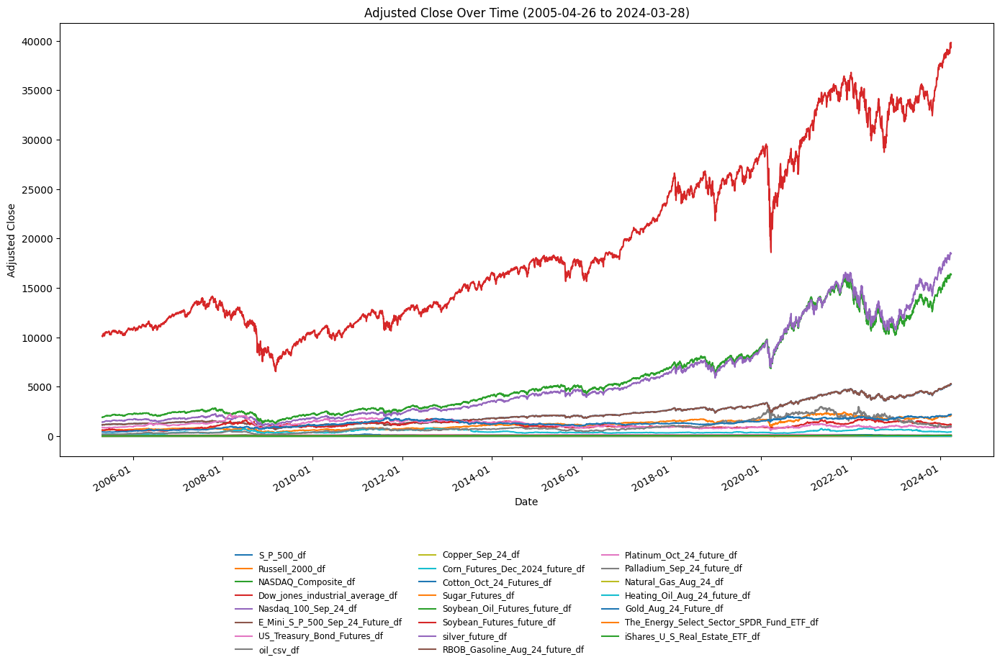

In [116]:
def filter_and_plot_assets(dfs, start_date, end_date, save_path='Financial_Asset_Visualization.svg'):
    # Combine all dataframes into one with an additional column to identify the source
    combined_df = pd.DataFrame()
    for name, df in dfs.items():
        df['Source'] = name
        combined_df = pd.concat([combined_df, df[['Date', 'Adj Close', 'Source']]])
    combined_df['Date'] = pd.to_datetime(combined_df['Date'])

    # Filter dataframes with a starting date before 2000-12-31
    filtered_sources = []
    for source in combined_df['Source'].unique():
        source_df = combined_df[combined_df['Source'] == source]
        if source_df['Date'].min() <= pd.to_datetime('2000-12-31'):
            filtered_sources.append(source)

    # Filter combined dataframe for the specified date range and sources
    filtered_df = combined_df[(combined_df['Date'] >= pd.to_datetime(start_date)) & 
                              (combined_df['Date'] <= pd.to_datetime(end_date)) & 
                              (combined_df['Source'].isin(filtered_sources))]
    plt.figure(figsize=(14, 10)) # plot the figure

    for source in filtered_df['Source'].unique():
        source_df = filtered_df[filtered_df['Source'] == source]
        plt.plot(source_df['Date'], source_df['Adj Close'], label=source)

    # Formatting the date on the x-axis to avoid clutter
    plt.gca().xaxis.set_major_locator(AutoDateLocator())
    plt.gca().xaxis.set_major_formatter(DateFormatter('%Y-%m'))

    plt.gcf().autofmt_xdate() # Rotate date labels for better readability

    plt.xlabel('Date')
    plt.ylabel('Adjusted Close')
    plt.title('Adjusted Close Over Time (2005-04-26 to 2024-03-28)')
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=3, fontsize='small', frameon=False) # Move the legend below the plot
    plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout to make room for the legend
    plt.savefig(save_path, format='svg')
    plt.show()

# Define the date range
start_date = '2005-04-26'
end_date = '2024-03-28'
filter_and_plot_assets(dfs, start_date, end_date)


In [117]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Function to assign quarter labels
def get_quarter_label(date):
    year = date.year
    month = date.month
    if month in [1, 2, 3]:
        quarter = 1
    elif month in [4, 5, 6]:
        quarter = 2
    elif month in [7, 8, 9]:
        quarter = 3
    else:
        quarter = 4
    return f"{year}_Q{quarter}"

# Function to process a single dataframe and return a summary with a custom column name
def process_dataframe(df, name, col_date='Date', col_adj_close='Adj Close'):
    df = df.copy()  # Make a copy to avoid modifying the original DataFrame
    df[col_date] = pd.to_datetime(df[col_date])
    df['quarter'] = df[col_date].apply(get_quarter_label)
    df_summary = df.groupby('quarter')[col_adj_close].mean().reset_index()
    df_summary.columns = ['Quarter', f'{name} Adj Close Average']

    return df_summary

# Function to merge multiple dataframes with the original dataframe
def merge_dataframes(original_df, dfs_summaries, key='Release_quarter'):
    merged_df = original_df.copy()
    for df_summary in dfs_summaries:
        merged_df = pd.merge(merged_df, df_summary, left_on=key, right_on='Quarter').drop(columns=['Quarter'])
    return merged_df

dfs = {
    'S_P_500_df': S_P_500_df, 'Russell_2000_df': Russell_2000_df, 'NASDAQ_Composite_df': NASDAQ_Composite_df,
    'Dow_jones_industrial_average_df': Dow_jones_industrial_average_df, 'Nasdaq_100_Sep_24_df': Nasdaq_100_Sep_24_df,
    'E_mini_Russell_2000_Index_Future_df': E_mini_Russell_2000_Index_Future_df, 'E_Mini_S_P_500_Sep_24_Future_df': E_Mini_S_P_500_Sep_24_Future_df,
    'Mini_Dow_Jones_Indus_future_Sep_24_df': Mini_Dow_Jones_Indus_future_Sep_24_df, 'US_Treasury_Bond_Futures_df': US_Treasury_Bond_Futures_df,
    'oil_csv_df': oil_csv_df, 'brent_oil_future_df': brent_oil_future_df, 'Copper_Sep_24_df': Copper_Sep_24_df,
    'Corn_Futures_Dec_2024_future_df': Corn_Futures_Dec_2024_future_df, 'Cotton_Oct_24_Futures_df': Cotton_Oct_24_Futures_df,
    'Sugar_Futures_df': Sugar_Futures_df, 'Soybean_Oil_Futures_future_df': Soybean_Oil_Futures_future_df,
    'Soybean_Futures_future_df': Soybean_Futures_future_df, 'silver_future_df': silver_future_df,
    'RBOB_Gasoline_Aug_24_future_df': RBOB_Gasoline_Aug_24_future_df, 'Platinum_Oct_24_future_df': Platinum_Oct_24_future_df,
    'Palladium_Sep_24_future_df': Palladium_Sep_24_future_df, 'Orange_Juice_Sep_24_Futures_df': Orange_Juice_Sep_24_Futures_df,
    'Natural_Gas_Aug_24_df': Natural_Gas_Aug_24_df, 'Heating_Oil_Aug_24_future_df': Heating_Oil_Aug_24_future_df,
    'Gold_Aug_24_Future_df': Gold_Aug_24_Future_df, 'Alerian_MLP_ETF_df': Alerian_MLP_ETF_df,
    'Fidelity_MSCI_Energy_Index_ETF_df': Fidelity_MSCI_Energy_Index_ETF_df, 'First_Trust_North_American_Energy_Infrastructure_Fund_ETF_df': First_Trust_North_American_Energy_Infrastructure_Fund_ETF_df,
    'Global_X_MLP_Energy_Infrastructure_ETF_df': Global_X_MLP_Energy_Infrastructure_ETF_df, 'Global_X_MLP_ETF_df': Global_X_MLP_ETF_df,
    'iShares_Global_Clean_Energy_ETF_df': iShares_Global_Clean_Energy_ETF_df, 'MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs_df': MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs_df,
    'SPDR_S_P_Oil_Gas_Exploration_Production_ETF_df': SPDR_S_P_Oil_Gas_Exploration_Production_ETF_df, 'The_Energy_Select_Sector_SPDR_Fund_ETF_df': The_Energy_Select_Sector_SPDR_Fund_ETF_df,
    'VanEck_Oil_Services_ETF_df': VanEck_Oil_Services_ETF_df, 'Vanguard_Energy_Index_Fund_ETF_Shares_ETF_df': Vanguard_Energy_Index_Fund_ETF_Shares_ETF_df,
    'Dimensional_Global_Real_Estate_ETF_df': Dimensional_Global_Real_Estate_ETF_df, 'Dimensional_US_Real_Estate_ETF_df': Dimensional_US_Real_Estate_ETF_df,
    'Fidelity_MSCI_Real_Estate_Index_ETF_df': Fidelity_MSCI_Real_Estate_Index_ETF_df, 'Invesco_Active_US_Real_Estate_Fund_ETF_df': Invesco_Active_US_Real_Estate_Fund_ETF_df,
    'iShares_Cohen_Steers_REIT_ETF_df': iShares_Cohen_Steers_REIT_ETF_df, 'iShares_Residential_and_Multisector_Real_Estate_ETF_df': iShares_Residential_and_Multisector_Real_Estate_ETF_df,
    'iShares_Trust_iShares_Core_US_REIT_ETF_df': iShares_Trust_iShares_Core_US_REIT_ETF_df, 'iShares_U_S_Real_Estate_ETF_df': iShares_U_S_Real_Estate_ETF_df,
    'JPMorgan_BetaBuilders_MSCI_US_REIT_ETF_df': JPMorgan_BetaBuilders_MSCI_US_REIT_ETF_df, 'Vanguard_Real_Estate_Index_Fund_ETF_df': Vanguard_Real_Estate_Index_Fund_ETF_df,
    'Schwab_U_S_REIT_ETF_df': Schwab_U_S_REIT_ETF_df, 'The_Real_Estate_Select_Sector_SPDR_Fund_ETF_df': The_Real_Estate_Select_Sector_SPDR_Fund_ETF_df,
    'SPDR_Dow_Jones_REIT_ETF_df': SPDR_Dow_Jones_REIT_ETF_df, 'VanEck_Steel_ETF_df': VanEck_Steel_ETF_df,
    'First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF_df': First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF_df,
    'Invesco_Russell_2000_Dynamic_Multifactor_ETF_df': Invesco_Russell_2000_Dynamic_Multifactor_ETF_df,
    'Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df': Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df,
    'iShares_MSCI_South_Africa_ETF_df': iShares_MSCI_South_Africa_ETF_df,
    'carbon future price': carbon_future_df

}

# Extract the earliest date from each dataframe
start_dates = []
names = []
filtered_dfs = []

# Set the criterion date
criterion_date = pd.to_datetime('2005-04-26')

for name, df in dfs.items():
    if not df.empty:
        start_date = pd.to_datetime(df['Date'].iloc[0])
        start_dates.append(start_date)
        names.append(name)
        # Check if the start date is before the criterion date
        if start_date < criterion_date:
            filtered_dfs.append((name, df))

# Process each filtered dataframe and store the summaries
dfs_summaries = []
for name, df in filtered_dfs:
    dfs_summaries.append(process_dataframe(df, name))

# Merge all summaries with the original dataframe
final_df = merge_dataframes(production_df, dfs_summaries)
final_df


,Release_quarter,net_sales,cost_of_sales,gross_profit,cash_and_temporary_investment,trade_accounts_receivables,other_receivables,inventories,other_current_assets,fixed_assets,...,The_Energy_Select_Sector_SPDR_Fund_ETF_df Adj Close Average,VanEck_Oil_Services_ETF_df Adj Close Average,Vanguard_Energy_Index_Fund_ETF_Shares_ETF_df Adj Close Average,iShares_Cohen_Steers_REIT_ETF_df Adj Close Average,iShares_U_S_Real_Estate_ETF_df Adj Close Average,Vanguard_Real_Estate_Index_Fund_ETF_df Adj Close Average,SPDR_Dow_Jones_REIT_ETF_df Adj Close Average,Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df Adj Close Average,iShares_MSCI_South_Africa_ETF_df Adj Close Average,carbon future price Adj Close Average
0,2005_Q2,4375937,2585820,1790117,1264807,1870546,609973,1116917,175715,13289809,...,24.539377,445.239555,38.236569,17.823069,29.484842,24.394707,30.441837,10.668339,17.901366,19.435106
1,2005_Q3,4298068,2489581,1808487,512486,1795423,726536,1109255,181720,13228426,...,28.777932,539.487784,44.833126,19.646837,32.022679,26.724592,33.527132,11.443325,20.499618,23.485385
2,2005_Q4,3962557,2599091,1363466,601452,1592667,775526,1037183,159817,15541789,...,29.077977,574.184459,45.563279,19.612547,31.557936,26.613003,33.488610,11.343409,22.365889,22.112500
3,2006_Q1,3928749,2515485,1413264,687796,1569759,802893,1128150,208864,15576004,...,31.606936,673.758625,49.371430,22.163073,35.147237,29.762390,37.732040,12.063823,27.859009,27.076563
4,2006_Q2,4613517,2860137,1753380,707945,1644998,982251,1170277,151604,15915601,...,32.638884,713.140491,51.253049,22.373248,35.518458,29.960910,38.087206,12.160127,27.394291,19.550794
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,2023_Q1,4035801,2746129,1289672,757806,1909796,525142,1767411,139373,11639315,...,81.290681,301.759208,113.025150,54.714545,84.077084,80.666522,86.550846,46.936970,41.258760,87.430615
72,2023_Q2,4566076,2987160,1578916,470793,2096332,630660,1823398,187470,11994582,...,78.222808,267.558762,108.288107,52.659356,81.247669,77.645815,84.258612,43.748387,39.180061,88.533968
73,2023_Q3,4570546,3009642,1560904,532512,2018808,586574,1734619,158398,11876465,...,84.769328,333.489347,118.785107,53.075640,82.779314,79.022346,86.631086,47.791705,39.150772,85.714462
74,2023_Q4,4243201,2811609,1431592,623933,1751468,649674,1789303,142197,12465655,...,83.463335,317.277236,117.189756,51.958366,80.451928,76.771536,83.692075,48.341921,38.259189,76.585079


In [118]:
# Obtain the list of all columns from final_df
all_columns = final_df.columns

# Columns to exclude
excluded_columns = [
    'cost_of_sales', 'gross_profit', 'cash_and_temporary_investment',
    'trade_accounts_receivables', 'other_receivables', 'inventories',
    'other_current_assets', 'fixed_assets', 'other_assets',
    'total_liabilities', 'consolidated_stockholder_equity', 'profit_margin',
    'number_of_unit_sold', 'unit_cost', 'unit_profit'
]

columns_to_select = [col for col in all_columns if col not in excluded_columns] # define the columns to select by excluding the unwanted columns
selected_columns_df = final_df[columns_to_select] # select the specified columns from final_df
selected_columns_df # display the dataframe


,Release_quarter,net_sales,average_price_per_ton,S_P_500_df Adj Close Average,Russell_2000_df Adj Close Average,NASDAQ_Composite_df Adj Close Average,Dow_jones_industrial_average_df Adj Close Average,Nasdaq_100_Sep_24_df Adj Close Average,E_Mini_S_P_500_Sep_24_Future_df Adj Close Average,Mini_Dow_Jones_Indus_future_Sep_24_df Adj Close Average,...,The_Energy_Select_Sector_SPDR_Fund_ETF_df Adj Close Average,VanEck_Oil_Services_ETF_df Adj Close Average,Vanguard_Energy_Index_Fund_ETF_Shares_ETF_df Adj Close Average,iShares_Cohen_Steers_REIT_ETF_df Adj Close Average,iShares_U_S_Real_Estate_ETF_df Adj Close Average,Vanguard_Real_Estate_Index_Fund_ETF_df Adj Close Average,SPDR_Dow_Jones_REIT_ETF_df Adj Close Average,Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df Adj Close Average,iShares_MSCI_South_Africa_ETF_df Adj Close Average,carbon future price Adj Close Average
0,2005_Q2,4375937,91.00,1181.974056,610.901566,2013.207653,10383.979370,1494.085312,1184.030157,10393.906250,...,24.539377,445.239555,38.236569,17.823069,29.484842,24.394707,30.441837,10.668339,17.901366,19.435106
1,2005_Q3,4298068,91.00,1224.174377,664.622654,2149.533436,10544.362457,1586.834688,1227.035782,10562.171875,...,28.777932,539.487784,44.833126,19.646837,32.022679,26.724592,33.527132,11.443325,20.499618,23.485385
2,2005_Q4,3962557,91.00,1230.468254,662.585875,2178.671902,10615.785838,1641.375938,1234.227968,10636.984127,...,29.077977,574.184459,45.563279,19.612547,31.557936,26.613003,33.488610,11.343409,22.365889,22.112500
3,2006_Q1,3928749,101.50,1283.655002,726.938547,2288.796296,11003.621456,1697.323750,1287.943907,11031.516129,...,31.606936,673.758625,49.371430,22.163073,35.147237,29.762390,37.732040,12.063823,27.859009,27.076563
4,2006_Q2,4613517,101.50,1280.811744,733.479203,2235.780475,11186.656979,1642.080469,1285.313906,11223.539683,...,32.638884,713.140491,51.253049,22.373248,35.518458,29.960910,38.087206,12.160127,27.394291,19.550794
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,2023_Q1,4035801,134.53,4000.064528,1856.468711,11481.441170,33218.659400,12168.240329,4014.819356,33303.214529,...,81.290681,301.759208,113.025150,54.714545,84.077084,80.666522,86.550846,46.936970,41.258760,87.430615
72,2023_Q2,4566076,134.53,4206.072900,1797.638544,12676.755513,33643.039976,13899.348554,4225.832260,33758.696636,...,78.222808,267.558762,108.288107,52.659356,81.247669,77.645815,84.258612,43.748387,39.180061,88.533968
73,2023_Q3,4570546,134.53,4458.137447,1891.736514,13785.277933,34669.474950,15319.177781,4481.432067,34802.502046,...,84.769328,333.489347,118.785107,53.075640,82.779314,79.022346,86.631086,47.791705,39.150772,85.714462
74,2023_Q4,4243201,134.53,4464.907622,1806.698574,13910.686678,34933.046689,15679.667664,4488.129219,35061.272644,...,83.463335,317.277236,117.189756,51.958366,80.451928,76.771536,83.692075,48.341921,38.259189,76.585079


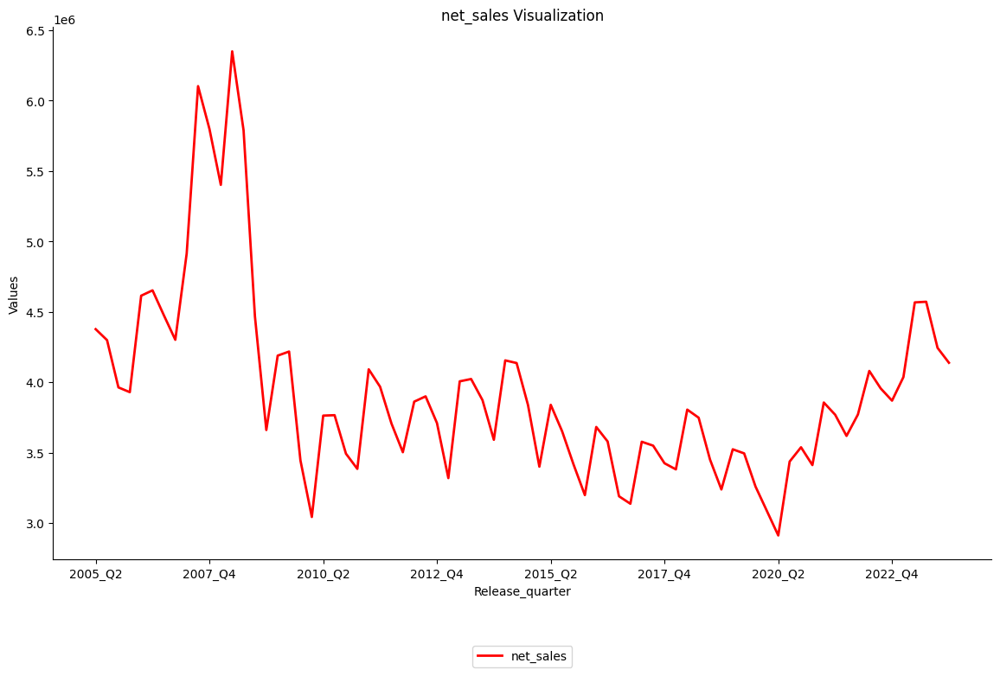

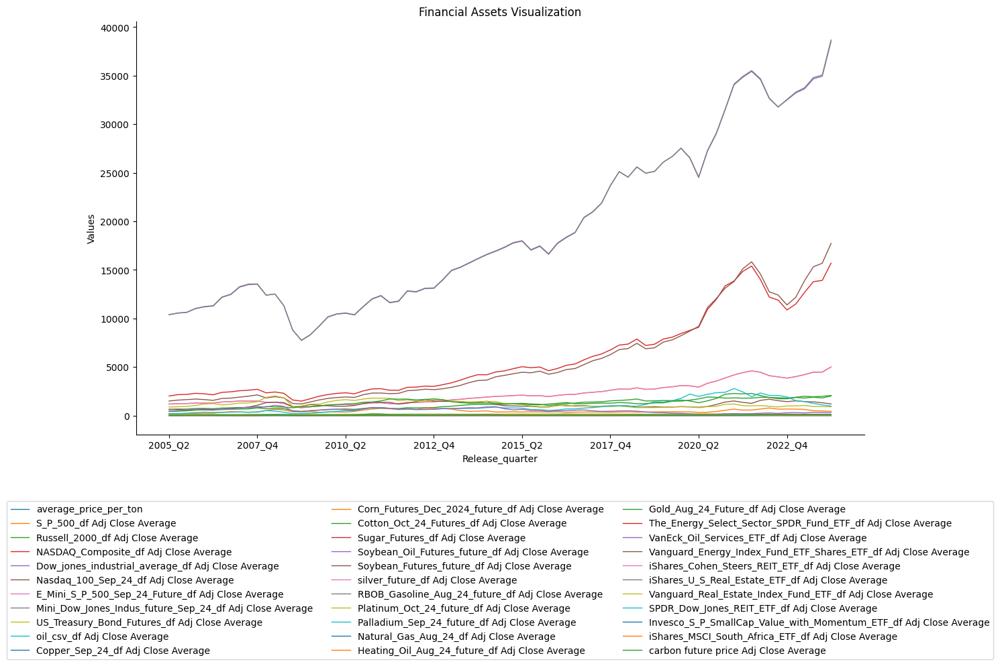

In [119]:
from matplotlib.ticker import MaxNLocator

def plot_column(df, columns, highlight_column, x_column, title, save_path):
    plt.figure(figsize=(14, 8))
    for column in columns:
        plt.plot(df[x_column], df[column], label=column, linewidth=2 if column == highlight_column else 1, color='red' if column == highlight_column else None)
    plt.xlabel(x_column)
    plt.ylabel('Values')
    plt.title(title)
    plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10))  # Reduce the number of x-axis labels
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)
    # Hide top and right spines, keep bottom and left for axes lines
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.savefig(save_path, format='svg')
    plt.show()

def plot_selected_columns_separately(df, highlight_column='net_sales', x_column='Release_quarter', save_path_base='Asset_Price_with_Demand'):
    # Plot for highlight_column
    plot_column(
        df, 
        [highlight_column], 
        highlight_column, 
        x_column, 
        f'{highlight_column} Visualization', 
        f'{save_path_base}_{highlight_column}.svg'
    )

    # Plot for other columns
    other_columns = [col for col in df.columns if col not in {x_column, highlight_column}]
    plot_column(
        df, 
        other_columns, 
        highlight_column, 
        x_column, 
        'Financial Assets Visualization', 
        f'{save_path_base}_Financial_Assets.svg'
    )

plot_selected_columns_separately(selected_columns_df) # use the function to plot and save the selected columns dataframe separately

## Part 1: Data Analysis

### Part 1.1 Data without transformation

#### Feature Selection wtih conventional data with flat features
#### Filter Method


In [120]:
def train_test_split(X, y, test_size=1):
    test_size_length = 1
    X_train = X[:-test_size_length]
    y_train = y[:-test_size_length]
    X_test = X[-test_size_length:]
    y_test = y[-test_size_length:]
    return X_train, X_test, y_train, y_test

def transform_data(X_train, X_test, transform_type = None):
    scaler = MinMaxScaler(feature_range = (0, 1))
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    if transform_type == "sigmoid":
        X_train_scaled, X_test_scaled = sigmoid(X_train_scaled), sigmoid(X_test_scaled)
    elif transform_type == "cosine":
        X_train_scaled, X_test_scaled = np.cos(X_train_scaled), np.cos(X_test_scaled)
    elif transform_type == "sine":
        X_train_scaled, X_test_scaled = np.sin(X_train_scaled), np.sin(X_test_scaled)
    return X_train_scaled, X_test_scaled

# Load the data
X, y = selected_columns_df.iloc[:, 2:], np.ravel(selected_columns_df[['net_sales']])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1)

# Standardize the data
X_train_scaled, X_test_scaled = transform_data(X_train, X_test)

In [121]:
len(X.columns)

33

In [122]:
X.columns

Index(['average_price_per_ton', 'S_P_500_df Adj Close Average',
       'Russell_2000_df Adj Close Average',
       'NASDAQ_Composite_df Adj Close Average',
       'Dow_jones_industrial_average_df Adj Close Average',
       'Nasdaq_100_Sep_24_df Adj Close Average',
       'E_Mini_S_P_500_Sep_24_Future_df Adj Close Average',
       'Mini_Dow_Jones_Indus_future_Sep_24_df Adj Close Average',
       'US_Treasury_Bond_Futures_df Adj Close Average',
       'oil_csv_df Adj Close Average', 'Copper_Sep_24_df Adj Close Average',
       'Corn_Futures_Dec_2024_future_df Adj Close Average',
       'Cotton_Oct_24_Futures_df Adj Close Average',
       'Sugar_Futures_df Adj Close Average',
       'Soybean_Oil_Futures_future_df Adj Close Average',
       'Soybean_Futures_future_df Adj Close Average',
       'silver_future_df Adj Close Average',
       'RBOB_Gasoline_Aug_24_future_df Adj Close Average',
       'Platinum_Oct_24_future_df Adj Close Average',
       'Palladium_Sep_24_future_df Adj Close Ave

#### Variance Threshold Method

In [123]:
def select_features_by_variance(X_train, num_features=3):
    selector = VarianceThreshold()
    selector.fit(X_train)
    top_features = np.argsort(selector.variances_)[::-1][:num_features]
    return X_train[:, top_features], top_features
X_train_var_1, top_features_variance_1 = select_features_by_variance(X_train_scaled, num_features=1)
X_train_var_2, top_features_variance_2 = select_features_by_variance(X_train_scaled, num_features=2)
X_train_var_3, top_features_variance_3 = select_features_by_variance(X_train_scaled, num_features=3)
X_train_var_4, top_features_variance_4 = select_features_by_variance(X_train_scaled, num_features=4)
X_train_var_5, top_features_variance_5 = select_features_by_variance(X_train_scaled, num_features=5)

#### Correlation Method

In [124]:
def select_features_by_correlation(X_train, y_train, num_features=3):
    correlations = np.abs(np.corrcoef(X_train.T, y_train.ravel())[0:-1, -1])
    top_features = np.argsort(correlations)[::-1][:num_features]
    return X_train[:, top_features], top_features

X_train_cor_1, top_features_correlation_1 = select_features_by_correlation(X_train_scaled, y_train, num_features=1)
X_train_cor_2, top_features_correlation_2 = select_features_by_correlation(X_train_scaled, y_train,num_features=2)
X_train_cor_3, top_features_correlation_3 = select_features_by_correlation(X_train_scaled, y_train, num_features=3)
X_train_cor_4, top_features_correlation_4 = select_features_by_correlation(X_train_scaled, y_train,num_features=4)
X_train_cor_5, top_features_correlation_5 = select_features_by_correlation(X_train_scaled, y_train, num_features=5)

#### Relief Algorithm

In [125]:
def select_features_by_relief(X_train, y_train, num_features=3):
    relief = ReliefF(n_features_to_select=num_features)
    relief.fit(X_train, y_train.ravel())
    top_features = relief.top_features_[:num_features]
    return X_train[:, top_features], top_features

X_train_relief_1, top_features_relief_1 = select_features_by_relief(X_train_scaled, y_train, num_features=1)
X_train_relief_2, top_features_relief_2 = select_features_by_relief(X_train_scaled, y_train,num_features=2)
X_train_relief_3, top_features_relief_3 = select_features_by_relief(X_train_scaled, y_train, num_features=3)
X_train_relief_4, top_features_relief_4 = select_features_by_relief(X_train_scaled, y_train,num_features=4)
X_train_relief_5, top_features_relief_5 = select_features_by_relief(X_train_scaled, y_train, num_features=5)

#### T-scores

In [126]:
from sklearn.feature_selection import f_regression
def select_features_by_t_scores(X_train, y_train, num_features=3):
    t_scores, p_values = f_regression(X_train, y_train)
    top_features = np.argsort(t_scores)[::-1][:num_features]
    return X_train[:, top_features], top_features

X_train_t_scores_1, top_features_t_scores_1 = select_features_by_t_scores(X_train_scaled, y_train, num_features=1)
X_train_t_scores_2, top_features_t_scores_2 = select_features_by_t_scores(X_train_scaled, y_train,num_features=2)
X_train_t_scores_3, top_features_t_scores_3 = select_features_by_t_scores(X_train_scaled, y_train, num_features=3)
X_train_t_scores_4, top_features_t_scores_4 = select_features_by_t_scores(X_train_scaled, y_train,num_features=4)
X_train_t_scores_5, top_features_t_scores_5 = select_features_by_t_scores(X_train_scaled, y_train, num_features=5)

#### Chi-squared score

In [127]:
def select_features_by_chi_square(X_train, y_train, num_features=3):
    chi_scores, p_values = chi2(X_train, y_train)
    top_features = np.argsort(chi_scores)[::-1][:num_features]
    return X_train[:, top_features], top_features

X_train_chi_square_1, top_features_chi_square_1 = select_features_by_chi_square(X_train_scaled, y_train, num_features=1)
X_train_chi_square_2, top_features_chi_square_2 = select_features_by_chi_square(X_train_scaled, y_train,num_features=2)
X_train_chi_square_3, top_features_chi_square_3 = select_features_by_chi_square(X_train_scaled, y_train, num_features=3)
X_train_chi_square_4, top_features_chi_square_4 = select_features_by_chi_square(X_train_scaled, y_train,num_features=4)
X_train_chi_square_5, top_features_chi_square_5 = select_features_by_chi_square(X_train_scaled, y_train, num_features=5)

#### Mutual Information

In [128]:
def select_features_by_mutual_information(X_train, y_train, num_features=3):
    mi_scores = mutual_info_regression(X_train, y_train)
    top_features = np.argsort(mi_scores)[::-1][:num_features]
    return X_train[:, top_features], top_features

X_train_mutual_information_1, top_features_mutual_information_1 = select_features_by_mutual_information(X_train_scaled, y_train, num_features=1)
X_train_mutual_information_2, top_features_mutual_information_2 = select_features_by_mutual_information(X_train_scaled, y_train,num_features=2)
X_train_mutual_information_3, top_features_mutual_information_3 = select_features_by_mutual_information(X_train_scaled, y_train, num_features=3)
X_train_mutual_information_4, top_features_mutual_information_4 = select_features_by_mutual_information(X_train_scaled, y_train,num_features=4)
X_train_mutual_information_5, top_features_mutual_information_5 = select_features_by_mutual_information(X_train_scaled, y_train, num_features=5)

#### Gini Index

In [129]:
from sklearn.tree import DecisionTreeClassifier

def select_features_by_gini_index(X, y, num_features=3):
    """
    Select features based on the Gini importance from a decision tree classifier.
    
    :param X: NumPy array, features.
    :param y: NumPy array, target.
    :param num_features: int, number of top features to select.
    :return: NumPy array, selected features.
    """
    tree = DecisionTreeRegressor(random_state=42)
    tree.fit(X, y)
    importances = tree.feature_importances_
    top_features = np.argsort(importances)[::-1][:num_features]
    return X[:, top_features], top_features

X_train_gini_index_1, top_features_gini_index_1 = select_features_by_gini_index(X_train_scaled, y_train, num_features=1)
X_train_gini_index_2, top_features_gini_index_2 = select_features_by_gini_index(X_train_scaled, y_train,num_features=2)
X_train_gini_index_3, top_features_gini_index_3 = select_features_by_gini_index(X_train_scaled, y_train, num_features=3)
X_train_gini_index_4, top_features_gini_index_4 = select_features_by_gini_index(X_train_scaled, y_train,num_features=4)
X_train_gini_index_5, top_features_gini_index_5 = select_features_by_gini_index(X_train_scaled, y_train, num_features=5)

In [130]:
variances = np.var(X_train_scaled, axis=0)
if np.any(variances == 0):
    print("Some features have zero variance; consider removing these features.")

#### Wrapper Method

In [131]:
def calculate_bic(model, X, y):
    n = X.shape[0]
    k = X.shape[1]
    predictions = model.predict(X)
    residual = np.sum((y - predictions) ** 2)
    bic = n * np.log(residual / n) + k * np.log(n)
    return bic

def forward_selection(X_train, y_train, X_test, y_test):
    features = list(range(X_train.shape[1]))
    selected_features = []
    current_score, best_new_score = float('inf'), float('inf')

    while features and current_score == best_new_score:
        scores_with_candidates = []
        for feature in tqdm(features, desc='Evaluating Features'):
            new_selected_features = selected_features + [feature]
            model = LinearRegression()
            model.fit(X_train[:, new_selected_features], y_train)
            score = calculate_bic(model, X_train[:, new_selected_features], y_train)
            scores_with_candidates.append((score, feature))
        
        scores_with_candidates.sort()
        best_new_score, best_candidate = scores_with_candidates[0]
        
        if current_score > best_new_score:
            selected_features.append(best_candidate)
            features.remove(best_candidate)
            current_score = best_new_score

    model = LinearRegression()
    model.fit(X_train[:, selected_features], y_train)
    return selected_features, model

selected_features_by_forward_selection, model_by_forward_selection = forward_selection(X_train_scaled, y_train, X_test_scaled, y_test)

Evaluating Features: 100%|██████████| 33/33 [00:00<00:00, 1003.09it/s]


Evaluating Features: 100%|██████████| 22/22 [00:00<00:00, 1140.79it/s]


In [132]:
def backward_elimination(X_train, y_train, X_test, y_test):
    features = list(range(X_train.shape[1]))
    while len(features) > 1:
        scores_with_candidates = []
        for feature in tqdm(features, desc='Evaluating Removal of Features'):
            candidates = list(features)
            candidates.remove(feature)
            model = LinearRegression()
            model.fit(X_train[:, candidates], y_train)
            score = calculate_bic(model, X_train[:, candidates], y_train)
            scores_with_candidates.append((score, feature))
        
        scores_with_candidates.sort()
        _, feature_to_remove = scores_with_candidates[0]
        features.remove(feature_to_remove)

    model = LinearRegression()
    model.fit(X_train[:, features], y_train)
    return features, model

selected_features_by_backward_selection, model_by_backward_selection = backward_elimination(X_train_scaled, y_train, X_test_scaled, y_test)


Evaluating Removal of Features: 100%|██████████| 2/2 [00:00<00:00, 1077.67it/s]


#### Genetic Algorithm

In [133]:
from deap import base, creator, tools, algorithms

def evaluate_linear_regression(individual, X_train, y_train):
    selected_features = [i for i, bit in enumerate(individual) if bit == 1]
    if not selected_features:
        return -20.0,  # Avoid empty subsets

    model = LinearRegression()
    scores = cross_val_score(model, X_train[:, selected_features], y_train, cv=5)
    penalty = np.exp(len(selected_features) * 0.1) - 1  # Exponential penalty for complexity
    return np.mean(scores) - penalty,

def evaluate_random_forest(individual, X_train, y_train):
    selected_features = [i for i, bit in enumerate(individual) if bit == 1]
    if not selected_features:
        return -20.0,

    model = RandomForestRegressor(n_estimators=100)
    scores = cross_val_score(model, X_train[:, selected_features], y_train, cv=5)
    penalty = np.exp(len(selected_features) * 0.1) - 1  # Exponential penalty for complexity
    return np.mean(scores) - penalty,

def evaluate_svr(individual, X_train, y_train):
    selected_features = [i for i, bit in enumerate(individual) if bit == 1]
    if not selected_features:
        return -20.0,

    model = SVR()
    scores = cross_val_score(model, X_train[:, selected_features], y_train, cv=5)
    penalty = np.exp(len(selected_features) * 0.1) - 1  # Exponential penalty for complexity
    return np.mean(scores) - penalty,

class GeneticAlgorithm:
    def __init__(self, X_train, y_train, feature_names, n=50, k=4, cxpb=0.7, mutpb=0.3, ngen=100, eval_function='linear_regression', seed=42):
        self.X_train = X_train
        self.y_train = y_train
        self.feature_names = feature_names
        self.population_size = n  # Population size is defined here
        self.num_features = k  # Number of features to select
        self.cxpb = cxpb
        self.mutpb = mutpb
        self.ngen = ngen

        if seed is not None:
            random.seed(seed)
            np.random.seed(seed)

        self.setup_deap_classes()
        self.toolbox = self.setup_ga_toolbox(eval_function)

    def setup_deap_classes(self):
        if "FitnessMax" not in creator.__dict__:
            creator.create("FitnessMax", base.Fitness, weights=(1.0,))
        if "Individual" not in creator.__dict__:
            creator.create("Individual", list, fitness=creator.FitnessMax)

    def setup_ga_toolbox(self, eval_function):
        toolbox = base.Toolbox()
        toolbox.register("attr_bool", self.generate_individual)
        toolbox.register("individual", tools.initIterate, creator.Individual, toolbox.attr_bool)
        toolbox.register("population", tools.initRepeat, list, toolbox.individual)

        # Register the evaluation function
        if eval_function == 'linear_regression':
            toolbox.register("evaluate", evaluate_linear_regression, X_train=self.X_train, y_train=self.y_train)
        elif eval_function == 'random_forest':
            toolbox.register("evaluate", evaluate_random_forest, X_train=self.X_train, y_train=self.y_train)
        elif eval_function == 'svr':
            toolbox.register("evaluate", evaluate_svr, X_train=self.X_train, y_train=self.y_train)

        toolbox.register("mate", self.mate_individuals)
        toolbox.register("mutate", self.mutate_individual)
        toolbox.register("select", tools.selBest)  # Use tools.selBest to select the best individuals
        return toolbox

    def generate_individual(self):
        individual = [0] * len(self.feature_names)
        selected_indices = random.sample(range(len(self.feature_names)), self.num_features)
        for index in selected_indices:
            individual[index] = 1
        return individual

    def mate_individuals(self, ind1, ind2):
        # Perform one-point crossover
        tools.cxOnePoint(ind1, ind2)
        # Ensure both individuals have exactly num_features features
        self.ensure_fixed_features(ind1)
        self.ensure_fixed_features(ind2)

    def mutate_individual(self, individual):
        # Flip bits with indpb probability
        tools.mutFlipBit(individual, indpb=0.1)
        # Ensure the individual has exactly num_features features
        self.ensure_fixed_features(individual)

    def ensure_fixed_features(self, individual):
        current_features = sum(individual)
        if current_features > self.num_features:
            to_zero = random.sample([i for i, bit in enumerate(individual) if bit == 1], current_features - self.num_features)
            for index in to_zero:
                individual[index] = 0
        elif current_features < self.num_features:
            to_one = random.sample([i for i, bit in enumerate(individual) if bit == 0], self.num_features - current_features)
            for index in to_one:
                individual[index] = 1

    def run(self):
        population = self.toolbox.population(n=self.population_size)
        
        for gen in range(self.ngen):
            # Evaluate all individuals in the population
            fitnesses = list(map(self.toolbox.evaluate, population))
            for ind, fit in zip(population, fitnesses):
                ind.fitness.values = fit

            # Select the next generation individuals (best half)
            offspring = self.toolbox.select(population, len(population) // 2)
            # Clone the selected individuals
            offspring = list(map(self.toolbox.clone, offspring))

            # Apply crossover and mutation on the offspring
            while len(offspring) < len(population):
                if random.random() < self.cxpb:
                    parent1, parent2 = random.sample(offspring, 2)
                    child1, child2 = self.toolbox.clone(parent1), self.toolbox.clone(parent2)
                    self.toolbox.mate(child1, child2)
                    offspring.extend([child1, child2])
                if random.random() < self.mutpb:
                    mutant = random.choice(offspring)
                    self.toolbox.mutate(mutant)
                    offspring.append(mutant)

            # Ensure the population size remains constant
            population[:] = offspring[:self.population_size]

        best_ind = tools.selBest(population, 1)[0]
        selected_features = self.extract_selected_features(best_ind)
        if self.feature_names is not None:
            print("Selected Feature Names:", [self.feature_names[i] for i in selected_features])
        return selected_features

    def extract_selected_features(self, individual):
        return [index for index, value in enumerate(individual) if value == 1]

def run_experiments(X_train, y_train, feature_names, configs):
    results = {}
    for config in configs:
        ga = GeneticAlgorithm(X_train, y_train, feature_names, n=config['n'], k=config['k'], ngen=config['ngen'], eval_function=config['eval_function'])
        key = f"{config['eval_function']}_n{config['n']}_k{config['k']}_ngen{config['ngen']}"
        results[key] = ga.run()
    return results

# Initial experiment configurations
initial_configs = [
    {'eval_function': 'linear_regression', 'n': 16, 'k': 2, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 16, 'k': 2, 'ngen': 30},
    {'eval_function': 'svr', 'n': 16, 'k': 2, 'ngen': 30},

    {'eval_function': 'linear_regression', 'n': 8, 'k': 2, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 8, 'k': 2, 'ngen': 30},
    {'eval_function': 'svr', 'n': 8, 'k': 2, 'ngen': 30},

    {'eval_function': 'linear_regression', 'n': 4, 'k': 2, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 4, 'k': 2, 'ngen': 30},
    {'eval_function': 'svr', 'n': 4, 'k': 2, 'ngen': 30},
]

# Run initial experiments
feature_results_evolutionary_algorithm = run_experiments(X_train_scaled, y_train, X_train.columns, initial_configs)

# Print initial results
for key, selected_features in feature_results_evolutionary_algorithm.items():
    print(f"{key}: {selected_features}")


Selected Feature Names: ['Natural_Gas_Aug_24_df Adj Close Average', 'iShares_MSCI_South_Africa_ETF_df Adj Close Average']
Selected Feature Names: ['Natural_Gas_Aug_24_df Adj Close Average', 'carbon future price Adj Close Average']
Selected Feature Names: ['RBOB_Gasoline_Aug_24_future_df Adj Close Average', 'Natural_Gas_Aug_24_df Adj Close Average']
Selected Feature Names: ['Natural_Gas_Aug_24_df Adj Close Average', 'Gold_Aug_24_Future_df Adj Close Average']
Selected Feature Names: ['Soybean_Oil_Futures_future_df Adj Close Average', 'Gold_Aug_24_Future_df Adj Close Average']
Selected Feature Names: ['RBOB_Gasoline_Aug_24_future_df Adj Close Average', 'SPDR_Dow_Jones_REIT_ETF_df Adj Close Average']
Selected Feature Names: ['Russell_2000_df Adj Close Average', 'Soybean_Oil_Futures_future_df Adj Close Average']
Selected Feature Names: ['Cotton_Oct_24_Futures_df Adj Close Average', 'Gold_Aug_24_Future_df Adj Close Average']
Selected Feature Names: ['NASDAQ_Composite_df Adj Close Average', '

In [134]:
# Additional experiment configurations
additional_configs_1 =  [
    {'eval_function': 'linear_regression', 'n': 8, 'k': 2, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 8, 'k': 2, 'ngen': 30},
    {'eval_function': 'svr', 'n': 8, 'k': 2, 'ngen': 30},

    {'eval_function': 'linear_regression', 'n': 8, 'k': 2, 'ngen': 15},
    {'eval_function': 'random_forest', 'n': 8, 'k': 2, 'ngen': 15},
    {'eval_function': 'svr', 'n': 8, 'k': 2, 'ngen': 15},

    {'eval_function': 'linear_regression', 'n': 8, 'k': 2, 'ngen': 5},
    {'eval_function': 'random_forest', 'n': 8, 'k': 2, 'ngen': 5},
    {'eval_function': 'svr', 'n': 8, 'k': 2, 'ngen': 5},
]

# Run initial experiments
feature_results_evolutionary_algorithm_addition_1 = run_experiments(X_train_scaled, y_train, X_train.columns, initial_configs)

Selected Feature Names: ['Natural_Gas_Aug_24_df Adj Close Average', 'iShares_MSCI_South_Africa_ETF_df Adj Close Average']
Selected Feature Names: ['Natural_Gas_Aug_24_df Adj Close Average', 'carbon future price Adj Close Average']
Selected Feature Names: ['RBOB_Gasoline_Aug_24_future_df Adj Close Average', 'Natural_Gas_Aug_24_df Adj Close Average']
Selected Feature Names: ['Natural_Gas_Aug_24_df Adj Close Average', 'Gold_Aug_24_Future_df Adj Close Average']
Selected Feature Names: ['Soybean_Oil_Futures_future_df Adj Close Average', 'Gold_Aug_24_Future_df Adj Close Average']
Selected Feature Names: ['RBOB_Gasoline_Aug_24_future_df Adj Close Average', 'SPDR_Dow_Jones_REIT_ETF_df Adj Close Average']
Selected Feature Names: ['Russell_2000_df Adj Close Average', 'Soybean_Oil_Futures_future_df Adj Close Average']
Selected Feature Names: ['Cotton_Oct_24_Futures_df Adj Close Average', 'Gold_Aug_24_Future_df Adj Close Average']
Selected Feature Names: ['NASDAQ_Composite_df Adj Close Average', '

In [135]:
# Additional experiment configurations 2
additional_configs_2 =  [
    {'eval_function': 'linear_regression', 'n': 8, 'k': 1, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 8, 'k': 1, 'ngen': 30},
    {'eval_function': 'svr', 'n': 8, 'k': 1, 'ngen': 30},

    {'eval_function': 'linear_regression', 'n': 8, 'k': 3, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 8, 'k': 3, 'ngen': 30},
    {'eval_function': 'svr', 'n': 8, 'k': 3, 'ngen': 30},

    {'eval_function': 'linear_regression', 'n': 8, 'k': 4, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 8, 'k': 4, 'ngen': 30},
    {'eval_function': 'svr', 'n': 8, 'k': 4, 'ngen': 30},

    {'eval_function': 'linear_regression', 'n': 8, 'k': 5, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 8, 'k': 5, 'ngen': 30},
    {'eval_function': 'svr', 'n': 8, 'k': 5, 'ngen': 30}
]

# Run initial experiments
feature_results_evolutionary_algorithm_addition_2 = run_experiments(X_train_scaled, y_train, X_train.columns, additional_configs_2)

Selected Feature Names: ['Natural_Gas_Aug_24_df Adj Close Average']
Selected Feature Names: ['US_Treasury_Bond_Futures_df Adj Close Average']
Selected Feature Names: ['RBOB_Gasoline_Aug_24_future_df Adj Close Average']
Selected Feature Names: ['US_Treasury_Bond_Futures_df Adj Close Average', 'Soybean_Oil_Futures_future_df Adj Close Average', 'iShares_MSCI_South_Africa_ETF_df Adj Close Average']
Selected Feature Names: ['Copper_Sep_24_df Adj Close Average', 'Gold_Aug_24_Future_df Adj Close Average', 'carbon future price Adj Close Average']
Selected Feature Names: ['RBOB_Gasoline_Aug_24_future_df Adj Close Average', 'iShares_Cohen_Steers_REIT_ETF_df Adj Close Average', 'Vanguard_Real_Estate_Index_Fund_ETF_df Adj Close Average']
Selected Feature Names: ['Sugar_Futures_df Adj Close Average', 'Soybean_Oil_Futures_future_df Adj Close Average', 'Palladium_Sep_24_future_df Adj Close Average', 'carbon future price Adj Close Average']
Selected Feature Names: ['oil_csv_df Adj Close Average', 'Soy

In [136]:
# Print initial results
for key, selected_features in feature_results_evolutionary_algorithm_addition_1.items():
    print(f"{key}: {selected_features}")

linear_regression_n16_k2_ngen30: [20, 31]
random_forest_n16_k2_ngen30: [20, 32]
svr_n16_k2_ngen30: [17, 20]
linear_regression_n8_k2_ngen30: [20, 22]
random_forest_n8_k2_ngen30: [14, 22]
svr_n8_k2_ngen30: [17, 29]
linear_regression_n4_k2_ngen30: [2, 14]
random_forest_n4_k2_ngen30: [12, 22]
svr_n4_k2_ngen30: [3, 10]


#### Embedded Method

In [137]:
from sklearn.linear_model import LassoCV

# Fit LassoCV for feature selection
lasso = LassoCV(alphas=[0.1, 0.01, 0.001], cv=5, max_iter=10000, tol=0.01).fit(X_train_scaled, y_train)

# Get the coefficients from the fitted model
coefficients = lasso.coef_

# Sort the indices of coefficients based on their absolute values in descending order
sorted_indices = np.argsort(np.abs(coefficients))[::-1]

# Initialize dictionaries to store selected features and transformed datasets
selected_features = {}
X_train_lasso = {}
X_test_lasso = {}

# Collect selected features from 1 to 5
for num_features in range(1, 6):
    selected_indices = sorted_indices[:num_features]
    selected_features[f'selected_features_by_lasso_{num_features}'] = selected_indices
    X_train_lasso[f'X_train_lasso_{num_features}'] = X_train_scaled[:, selected_indices]
    X_test_lasso[f'X_test_lasso_{num_features}'] = X_test_scaled[:, selected_indices]

# Print the selected features for each case
for num_features in range(1, 6):
    print(f"Selected features using Lasso ({num_features} features):",
          selected_features[f'selected_features_by_lasso_{num_features}'])

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 580318960660.8948, tolerance: 74470455944.384
  model = cd_fast.enet_coordinate_descent_gram(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 575299467183.0276, tolerance: 74470455944.384
  model = cd_fast.enet_coordinate_descent_gram(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 569865935424.0914, tolerance: 74470455944.384
  model = cd_fast.enet_coordinate_des

Selected features using Lasso (1 features): [5]
Selected features using Lasso (2 features): [ 5 23]
Selected features using Lasso (3 features): [ 5 23 26]
Selected features using Lasso (4 features): [ 5 23 26  6]
Selected features using Lasso (5 features): [ 5 23 26  6 25]


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 817332730031.7871, tolerance: 310068938033.6033
  model = cd_fast.enet_coordinate_descent_gram(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.468e+12, tolerance: 3.383e+11
  model = cd_fast.enet_coordinate_descent(


In [138]:
n_estimators = 200
max_depth = 5
learning_rate = 0.1
random_state = 42

# Fit RandomForestRegressor with additional parameters
random_forest = RandomForestRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=random_state)
random_forest.fit(X_train_scaled, y_train)

# Fit XGBRegressor with additional parameters
xgb_model = xgb.XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, learning_rate=learning_rate, random_state=random_state)
xgb_model.fit(X_train_scaled, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [139]:
importances_rf = random_forest.feature_importances_ # get the feature importances from the fitted model
sorted_indices_rf = np.argsort(importances_rf)[::-1] # sort the indices of importances in descending order

# initialize dictionaries to store selected features and transformed datasets
selected_features_rf = {}
X_train_rf = {}
X_test_rf = {}

# collect selected features from 1 to 5
for num_features in range(1, 6):
    selected_indices_rf = sorted_indices_rf[:num_features]
    selected_features_rf[f'selected_features_by_rf_{num_features}'] = selected_indices_rf
    X_train_rf[f'X_train_rf_{num_features}'] = X_train_scaled[:, selected_indices_rf]
    X_test_rf[f'X_test_rf_{num_features}'] = X_test_scaled[:, selected_indices_rf]

# print the selected features for each case
for num_features in range(1, 6):
    print(f"Selected features using Random Forest ({num_features} features):",
          selected_features_rf[f'selected_features_by_rf_{num_features}'])

Selected features using Random Forest (1 features): [24]
Selected features using Random Forest (2 features): [24  8]
Selected features using Random Forest (3 features): [24  8 22]
Selected features using Random Forest (4 features): [24  8 22 20]
Selected features using Random Forest (5 features): [24  8 22 20 18]


In [140]:
importances_xgb = xgb_model.feature_importances_ # get the feature importances from the fitted model
sorted_indices_xgb = np.argsort(importances_xgb)[::-1] # sort the indices of importances in descending order

# Initialize dictionaries to store selected features and transformed datasets
selected_features_xgb = {}
X_train_xgb = {}
X_test_xgb = {}

# Collect selected features from 1 to 5
for num_features in range(1, 6):
    selected_indices_xgb = sorted_indices_xgb[:num_features]
    selected_features_xgb[f'selected_features_by_xgb_{num_features}'] = selected_indices_xgb
    X_train_xgb[f'X_train_xgb_{num_features}'] = X_train_scaled[:, selected_indices_xgb]
    X_test_xgb[f'X_test_xgb_{num_features}'] = X_test_scaled[:, selected_indices_xgb]

# Print the selected features for each case
for num_features in range(1, 6):
    print(f"Selected features using Gradient Boosted Trees ({num_features} features):",
          selected_features_xgb[f'selected_features_by_xgb_{num_features}'])

Selected features using Gradient Boosted Trees (1 features): [20]
Selected features using Gradient Boosted Trees (2 features): [20 18]
Selected features using Gradient Boosted Trees (3 features): [20 18 25]
Selected features using Gradient Boosted Trees (4 features): [20 18 25 24]
Selected features using Gradient Boosted Trees (5 features): [20 18 25 24 22]


### Controlled Experiment

#### General feature selection

In [141]:
data = {
    'Variance_1': top_features_variance_1,
    'Variance_2': top_features_variance_2,
    'Variance_3': top_features_variance_3,
    'Variance_4': top_features_variance_4,
    'Variance_5': top_features_variance_5,
    'Variance_1': top_features_variance_1,
    'Variance_2': top_features_variance_2,
    'Variance_3': top_features_variance_3,
    'Variance_4': top_features_variance_4,
    'Variance_5': top_features_variance_5,
    'Correlation_1': top_features_correlation_1,
    'Correlation_2': top_features_correlation_2,
    'Correlation_3': top_features_correlation_3,
    'Correlation_4': top_features_correlation_4,
    'Correlation_5': top_features_correlation_5,
    'Relief_1': top_features_relief_1,
    'Relief_2': top_features_relief_2,
    'Relief_3': top_features_relief_3,
    'Relief_4': top_features_relief_4,
    'Relief_5': top_features_relief_5,
    'T-Scores_1': top_features_t_scores_1,
    'T-Scores_2': top_features_t_scores_2,
    'T-Scores_3': top_features_t_scores_3,
    'T-Scores_4': top_features_t_scores_4,
    'T-Scores_5': top_features_t_scores_5,
    'Chi-Square_1': top_features_chi_square_1,
    'Chi-Square_2': top_features_chi_square_2,
    'Chi-Square_3': top_features_chi_square_3,
    'Chi-Square_4': top_features_chi_square_4,
    'Chi-Square_5': top_features_chi_square_5,
    'Mutual Information_1': top_features_mutual_information_1,
    'Mutual Information_2': top_features_mutual_information_2,
    'Mutual Information_3': top_features_mutual_information_3,
    'Mutual Information_4': top_features_mutual_information_4,
    'Mutual Information_5': top_features_mutual_information_5,
    'Gini Index_1': top_features_gini_index_1,
    'Gini Index_2': top_features_gini_index_2,
    'Gini Index_3': top_features_gini_index_3,
    'Gini Index_4': top_features_gini_index_4,
    'Gini Index_5': top_features_gini_index_5,
    'forward_selection': selected_features_by_forward_selection,
    'backward_elimination': selected_features_by_backward_selection,
}

# Using the update method to add the dictionaries to the data dictionary
data.update(selected_features)
data.update(selected_features_rf)
data.update(selected_features_xgb)
data.update(feature_results_evolutionary_algorithm)
data.update(feature_results_evolutionary_algorithm_addition_1)
data.update(feature_results_evolutionary_algorithm_addition_2)
result_df = pd.DataFrame(columns=['selection method', 'model', 'degree', 'Selected Features', 'MSE Train', 'MSE Test', 'MAE Train', 'MAE Test', 'R2 Train', 'R2 Test', 'Weights', 'Intercept', 'Lambda'])

In [142]:
len(data)

73

In [143]:
# polynomial regression model with degree 1
maximum_degree = 1
for degree in tqdm(range(1, maximum_degree+1), desc='Polynomial degree loop'):
    poly = PolynomialFeatures(degree)

    for feature_selection_name, picked_feature_list in data.items():

        # Select and transform features
        X_train_scaled_picked = poly.fit_transform(X_train_scaled[:, picked_feature_list])
        X_test_scaled_picked = poly.transform(X_test_scaled[:, picked_feature_list])

        # Fit the linear regression model
        lin_reg = LinearRegression()
        lin_reg.fit(X_train_scaled_picked, y_train)
        
        # Predictions and MSE calculations
        lin_reg_prediction_in_train_set = lin_reg.predict(X_train_scaled_picked)
        lin_reg_prediction_in_test_set = lin_reg.predict(X_test_scaled_picked)
        
        mse_train = mean_squared_error(y_train, lin_reg_prediction_in_train_set)
        mse_test = mean_squared_error(y_test, lin_reg_prediction_in_test_set)
        
        mae_train = mean_absolute_error(y_train, lin_reg_prediction_in_train_set)
        mae_test = mean_absolute_error(y_test, lin_reg_prediction_in_test_set)
        
        r2_train = r2_score(y_train, lin_reg_prediction_in_train_set)
        r2_test = r2_score(y_test, lin_reg_prediction_in_test_set)
        
        mean_train = np.mean(lin_reg_prediction_in_train_set)
        mean_test = np.mean(lin_reg_prediction_in_test_set)
        std_variance_train = np.std(lin_reg_prediction_in_train_set)
        std_variance_test = np.std(lin_reg_prediction_in_test_set)

        # Construct a new DataFrame row
        new_row = pd.DataFrame({
            'selection method': [feature_selection_name],
            'model': ['polynomial regression'],
            'degree': degree,
            'Selected Features': [picked_feature_list],
            'MSE Train': [mse_train],
            'MSE Test': [mse_test],
            'MAE Train': [mae_train],
            'MAE Test': [mae_test],
            'R2 Train': [r2_train],
            'R2 Test': [r2_test],
            'Mean Train': [mean_train],
            'Mean Test': [mean_test],
            'Std Train': [std_variance_train],
            'Std Test': [std_variance_test],
            'Weights': [lin_reg.coef_],
            'Intercept': [lin_reg.intercept_],
            'Lambda': None
        })
        
        result_df = pd.concat([result_df if not result_df.empty else None, new_row], ignore_index=True)


Polynomial degree loop:   0%|          | 0/1 [00:00<?, ?it/s]

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Pyth

#### Ridge Regression model

In [144]:
from sklearn.linear_model import Ridge
# Ridge Regression Model

maximum_degree = 4
lambda_list = np.logspace(-5.0, 5.0, num=100)
for degree in tqdm(range(1, maximum_degree+1), desc='Polynomial degree loop'):
    poly = PolynomialFeatures(degree)
    for lambda_value in lambda_list:

        for feature_selection_name, picked_feature_list in data.items():
            # Select and transform features
            X_train_scaled_picked = poly.fit_transform(X_train_scaled[:, picked_feature_list])
            X_test_scaled_picked = poly.transform(X_test_scaled[:, picked_feature_list])

            # Fit the ridge regression model
            ridge_reg = Ridge(alpha=lambda_value)  # Create Ridge regression model with each lambda value in lambda_list
            ridge_reg.fit(X_train_scaled_picked, y_train)  # Fit the model with transformed x_train set and y_train set
            
            # Predictions and MSE calculations
            ridge_reg_prediction_in_train_set = ridge_reg.predict(X_train_scaled_picked)
            ridge_reg_prediction_in_test_set = ridge_reg.predict(X_test_scaled_picked)
            
            mse_train = mean_squared_error(y_train, ridge_reg_prediction_in_train_set)
            mse_test = mean_squared_error(y_test, ridge_reg_prediction_in_test_set)
            
            mae_train = mean_absolute_error(y_train, ridge_reg_prediction_in_train_set)
            mae_test = mean_absolute_error(y_test, ridge_reg_prediction_in_test_set)
            
            r2_train = r2_score(y_train, ridge_reg_prediction_in_train_set)
            r2_test = r2_score(y_test, ridge_reg_prediction_in_test_set)
            
            mean_train = np.mean(ridge_reg_prediction_in_train_set)
            mean_test = np.mean(ridge_reg_prediction_in_test_set)
            std_variance_train = np.std(ridge_reg_prediction_in_train_set)
            std_variance_test = np.std(ridge_reg_prediction_in_test_set)

            # Construct a new DataFrame row
            new_row = pd.DataFrame({
                'selection method': [feature_selection_name],
                'model': ['Ridge regression'],
                'degree': [degree],
                'Selected Features': [picked_feature_list],
                'MSE Train': [mse_train],
                'MSE Test': [mse_test],
                'MAE Train': [mae_train],
                'MAE Test': [mae_test],
                'R2 Train': [r2_train],
                'R2 Test': [r2_test],
                'Mean Train': [mean_train],
                'Mean Test': [mean_test],
                'Std Train': [std_variance_train],
                'Std Test': [std_variance_test],
                'Weights': [ridge_reg.coef_],
                'Intercept': [ridge_reg.intercept_],
                'Lambda': [lambda_value]
            })
            
            result_df = pd.concat([result_df if not result_df.empty else None, new_row], ignore_index=True)


Polynomial degree loop:   0%|          | 0/4 [00:00<?, ?it/s]/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/var/folders/t1/rjlykv2x6bsbc8v5985mwv2h0000gn/T/ipykernel_2983/1618220148.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df if not result_df.empty else None, new_row], ignore_index=True)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, U

#### Lasso Regression

In [145]:
from sklearn.linear_model import Lasso
# Lasso Regression

maximum_degree = 4
alpha_list = np.logspace(-5.0, 5, num=20)
for degree in tqdm(range(1, maximum_degree+1), desc='Polynomial degree loop'):
    poly = PolynomialFeatures(degree)
    for alpha_value in alpha_list:

        for feature_selection_name, picked_feature_list in data.items():
            # Select and transform features
            X_train_scaled_picked = poly.fit_transform(X_train_scaled[:, picked_feature_list])
            X_test_scaled_picked = poly.transform(X_test_scaled[:, picked_feature_list])

            # Fit the Lasso regression model
            lasso_regression = Lasso(alpha=alpha_value, max_iter=10000, tol=1e-3)
            lasso_regression.fit(X_train_scaled_picked, y_train)
            
            # Predictions and calculations
            lasso_regression_prediction_in_train_set = lasso_regression.predict(X_train_scaled_picked)
            lasso_regression_prediction_in_test_set = lasso_regression.predict(X_test_scaled_picked)
            
            mse_train = mean_squared_error(y_train, lasso_regression_prediction_in_train_set)
            mse_test = mean_squared_error(y_test, lasso_regression_prediction_in_test_set)
            
            mae_train = mean_absolute_error(y_train, lasso_regression_prediction_in_train_set)
            mae_test = mean_absolute_error(y_test, lasso_regression_prediction_in_test_set)
            
            r2_train = r2_score(y_train, lasso_regression_prediction_in_train_set)
            r2_test = r2_score(y_test, lasso_regression_prediction_in_test_set)
            
            mean_train = np.mean(lasso_regression_prediction_in_train_set)
            mean_test = np.mean(lasso_regression_prediction_in_test_set)
            std_variance_train = np.std(lasso_regression_prediction_in_train_set)
            std_variance_test = np.std(lasso_regression_prediction_in_test_set)

            # Construct a new DataFrame row
            new_row = pd.DataFrame({
                'selection method': [feature_selection_name],
                'model': ['Lasso regression'],
                'degree': [degree],
                'Selected Features': [picked_feature_list],
                'MSE Train': [mse_train],
                'MSE Test': [mse_test],
                'MAE Train': [mae_train],
                'MAE Test': [mae_test],
                'R2 Train': [r2_train],
                'R2 Test': [r2_test],
                'Mean Train': [mean_train],
                'Mean Test': [mean_test],
                'Std Train': [std_variance_train],
                'Std Test': [std_variance_test],
                'Weights': [lasso_regression.coef_],
                'Intercept': [lasso_regression.intercept_],
                'Alpha': [alpha_value]
            })
            
            result_df = pd.concat([result_df if not result_df.empty else None, new_row], ignore_index=True)


Polynomial degree loop:   0%|          | 0/4 [00:00<?, ?it/s]/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.304e+13, tolerance: 3.383e+10
  model = cd_fast.enet_coordinate_descent(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3

#### Random Forest Regression

In [146]:
from sklearn.ensemble import RandomForestRegressor
# random forest regression model

maximum_degree = 4
for degree in tqdm(range(1, maximum_degree + 1), desc='Polynomial degree loop'):
    poly = PolynomialFeatures(degree)

    for feature_selection_name, picked_feature_list in data.items():
        
        # Select and transform features
        X_train_scaled_picked = poly.fit_transform(X_train_scaled[:, picked_feature_list])
        X_test_scaled_picked = poly.transform(X_test_scaled[:, picked_feature_list])

        # Fit the Random Forest Regressor model
        rf_reg = RandomForestRegressor(n_estimators=100, random_state=42)
        rf_reg.fit(X_train_scaled_picked, y_train)
        
        # Predictions and MSE calculations
        rf_prediction_in_train_set = rf_reg.predict(X_train_scaled_picked)
        rf_prediction_in_test_set = rf_reg.predict(X_test_scaled_picked)
        
        mse_train = mean_squared_error(y_train, rf_prediction_in_train_set)
        mse_test = mean_squared_error(y_test, rf_prediction_in_test_set)
        
        mae_train = mean_absolute_error(y_train, rf_prediction_in_train_set)
        mae_test = mean_absolute_error(y_test, rf_prediction_in_test_set)
        
        r2_train = r2_score(y_train, rf_prediction_in_train_set)
        r2_test = r2_score(y_test, rf_prediction_in_test_set)
        
        mean_train = np.mean(rf_prediction_in_train_set)
        mean_test = np.mean(rf_prediction_in_test_set)
        std_variance_train = np.std(rf_prediction_in_train_set)
        std_variance_test = np.std(rf_prediction_in_test_set)

        # Construct a new DataFrame row
        new_row = pd.DataFrame({
            'selection method': [feature_selection_name],
            'model': ['Random Forest'],
            'degree': [degree],
            'Selected Features': [picked_feature_list],
            'MSE Train': [mse_train],
            'MSE Test': [mse_test],
            'MAE Train': [mae_train],
            'MAE Test': [mae_test],
            'R2 Train': [r2_train],
            'R2 Test': [r2_test],
            'Mean Train': [mean_train],
            'Mean Test': [mean_test],
            'Std Train': [std_variance_train],
            'Std Test': [std_variance_test],
            'Feature Importances': [rf_reg.feature_importances_]
        })
        
        result_df = pd.concat([result_df if not result_df.empty else None, new_row], ignore_index=True)

# Print the DataFrame
print(result_df.head())


Polynomial degree loop:   0%|          | 0/4 [00:00<?, ?it/s]/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Pyth

  selection method                  model  degree Selected Features  \
0       Variance_1  polynomial regression       1               [0]   
1       Variance_2  polynomial regression       1            [0, 7]   
2       Variance_3  polynomial regression       1         [0, 7, 4]   
3       Variance_4  polynomial regression       1      [0, 7, 4, 5]   
4       Variance_5  polynomial regression       1   [0, 7, 4, 5, 6]   

      MSE Train      MSE Test      MAE Train       MAE Test  R2 Train  \
0  4.408415e+11  1.285203e+11  475852.243842  358497.233694  0.022573   
1  3.975395e+11  9.164483e+11  461374.746392  957313.078671  0.118581   
2  2.866559e+11  2.151451e+11  386384.979673  463837.375895  0.364431   
3  2.802917e+11  4.213462e+11  373744.388253  649111.823945  0.378542   
4  2.533887e+11  4.903147e+11  355626.215652  700224.735446  0.438191   

   R2 Test    Mean Train     Mean Test      Std Train  Std Test  \
0      NaN  3.923968e+06  3.779014e+06  100900.314836       0.0   


#### Support Vector Machine

In [147]:
from sklearn.svm import SVR
maximum_degree = 4
C_list = [0.1, 1, 5, 10, 50, 100, 1000]
epsilon_list = [0.1, 1, 5, 10, 50, 100, 1000]
kernels = ['linear', 'poly', 'rbf', 'sigmoid']  # Additional kernels

for degree in tqdm(range(1, maximum_degree + 1), desc='Polynomial degree loop'):
    poly = PolynomialFeatures(degree)
    
    for feature_selection_name, picked_feature_list in data.items():
        print(f'Processing feature selection method: {feature_selection_name}')
        print(f"picked_feature_list: {picked_feature_list}")
        
        # Select and transform features
        X_train_scaled_picked = poly.fit_transform(X_train_scaled[:, picked_feature_list])
        X_test_scaled_picked = poly.transform(X_test_scaled[:, picked_feature_list])
        
        # Debug: Check transformed features
        print(f"Transformed X_train_scaled_picked shape: {X_train_scaled_picked.shape}")
        print(f"Transformed X_test_scaled_picked shape: {X_test_scaled_picked.shape}")
        
        for C_value in C_list:
            for epsilon_value in epsilon_list:
                for kernel in kernels:
                    # Fit the SVM model
                    svm_reg = SVR(kernel=kernel, C=C_value, epsilon=epsilon_value)
                    svm_reg.fit(X_train_scaled_picked, y_train)
                    
                    # Predictions and MSE calculations
                    svm_prediction_in_train_set = svm_reg.predict(X_train_scaled_picked)
                    svm_prediction_in_test_set = svm_reg.predict(X_test_scaled_picked)

                    mse_train = mean_squared_error(y_train, svm_prediction_in_train_set)
                    mse_test = mean_squared_error(y_test, svm_prediction_in_test_set)
                    
                    mae_train = mean_absolute_error(y_train, svm_prediction_in_train_set)
                    mae_test = mean_absolute_error(y_test, svm_prediction_in_test_set)
                    
                    # r2_train = r2_score(y_train, svm_prediction_in_train_set)
                    # r2_test = r2_score(y_test, svm_prediction_in_test_set)
                    
                    mean_train = np.mean(svm_prediction_in_train_set)
                    mean_test = np.mean(svm_prediction_in_test_set)
                    std_variance_train = np.std(svm_prediction_in_train_set)
                    std_variance_test = np.std(svm_prediction_in_test_set)

                    # Extract SVM-specific information
                    num_support_vectors = len(svm_reg.support_)
                    support_vectors = svm_reg.support_vectors_

                    # Construct a new DataFrame row
                    new_row = pd.DataFrame({
                        'selection method': [feature_selection_name],
                        'model': ['SVM'],
                        'degree': [degree],
                        'kernel': [kernel],  # Added kernel information
                        'Selected Features': [picked_feature_list],
                        'C': [C_value],
                        'Epsilon': [epsilon_value],
                        'MSE Train': [mse_train],
                        'MSE Test': [mse_test],
                        'MAE Train': [mae_train],
                        'MAE Test': [mae_test],
                        'R2 Train': [0],
                        'R2 Test': [0],
                        'Mean Train': [mean_train],
                        'Mean Test': [mean_test],
                        'Std Train': [std_variance_train],
                        'Std Test': [std_variance_test],
                        'Num Support Vectors': [num_support_vectors],
                        'Support Vectors': [support_vectors.tolist()]  # Convert array to list for DataFrame compatibility
                    })

                    result_df = pd.concat([result_df, new_row], ignore_index=True)

# Print the DataFrame
print(result_df.head())


Polynomial degree loop:   0%|          | 0/4 [00:00<?, ?it/s]

Processing feature selection method: Variance_1
picked_feature_list: [0]
Transformed X_train_scaled_picked shape: (75, 2)
Transformed X_test_scaled_picked shape: (1, 2)
Processing feature selection method: Variance_2
picked_feature_list: [0 7]
Transformed X_train_scaled_picked shape: (75, 3)
Transformed X_test_scaled_picked shape: (1, 3)
Processing feature selection method: Variance_3
picked_feature_list: [0 7 4]
Transformed X_train_scaled_picked shape: (75, 4)
Transformed X_test_scaled_picked shape: (1, 4)
Processing feature selection method: Variance_4
picked_feature_list: [0 7 4 5]
Transformed X_train_scaled_picked shape: (75, 5)
Transformed X_test_scaled_picked shape: (1, 5)
Processing feature selection method: Variance_5
picked_feature_list: [0 7 4 5 6]
Transformed X_train_scaled_picked shape: (75, 6)
Transformed X_test_scaled_picked shape: (1, 6)
Processing feature selection method: Correlation_1
picked_feature_list: [20]
Transformed X_train_scaled_picked shape: (75, 2)
Transform

Polynomial degree loop:  25%|██▌       | 1/4 [03:04<09:12, 184.13s/it]

Processing feature selection method: Variance_1
picked_feature_list: [0]
Transformed X_train_scaled_picked shape: (75, 3)
Transformed X_test_scaled_picked shape: (1, 3)
Processing feature selection method: Variance_2
picked_feature_list: [0 7]
Transformed X_train_scaled_picked shape: (75, 6)
Transformed X_test_scaled_picked shape: (1, 6)
Processing feature selection method: Variance_3
picked_feature_list: [0 7 4]
Transformed X_train_scaled_picked shape: (75, 10)
Transformed X_test_scaled_picked shape: (1, 10)
Processing feature selection method: Variance_4
picked_feature_list: [0 7 4 5]
Transformed X_train_scaled_picked shape: (75, 15)
Transformed X_test_scaled_picked shape: (1, 15)
Processing feature selection method: Variance_5
picked_feature_list: [0 7 4 5 6]
Transformed X_train_scaled_picked shape: (75, 21)
Transformed X_test_scaled_picked shape: (1, 21)
Processing feature selection method: Correlation_1
picked_feature_list: [20]
Transformed X_train_scaled_picked shape: (75, 3)
Tra

Polynomial degree loop:  50%|█████     | 2/4 [06:12<06:12, 186.34s/it]

Processing feature selection method: Variance_1
picked_feature_list: [0]
Transformed X_train_scaled_picked shape: (75, 4)
Transformed X_test_scaled_picked shape: (1, 4)
Processing feature selection method: Variance_2
picked_feature_list: [0 7]
Transformed X_train_scaled_picked shape: (75, 10)
Transformed X_test_scaled_picked shape: (1, 10)
Processing feature selection method: Variance_3
picked_feature_list: [0 7 4]
Transformed X_train_scaled_picked shape: (75, 20)
Transformed X_test_scaled_picked shape: (1, 20)
Processing feature selection method: Variance_4
picked_feature_list: [0 7 4 5]
Transformed X_train_scaled_picked shape: (75, 35)
Transformed X_test_scaled_picked shape: (1, 35)
Processing feature selection method: Variance_5
picked_feature_list: [0 7 4 5 6]
Transformed X_train_scaled_picked shape: (75, 56)
Transformed X_test_scaled_picked shape: (1, 56)
Processing feature selection method: Correlation_1
picked_feature_list: [20]
Transformed X_train_scaled_picked shape: (75, 4)
T

Polynomial degree loop:  75%|███████▌  | 3/4 [09:50<03:21, 201.10s/it]

Processing feature selection method: Variance_1
picked_feature_list: [0]
Transformed X_train_scaled_picked shape: (75, 5)
Transformed X_test_scaled_picked shape: (1, 5)
Processing feature selection method: Variance_2
picked_feature_list: [0 7]
Transformed X_train_scaled_picked shape: (75, 15)
Transformed X_test_scaled_picked shape: (1, 15)
Processing feature selection method: Variance_3
picked_feature_list: [0 7 4]
Transformed X_train_scaled_picked shape: (75, 35)
Transformed X_test_scaled_picked shape: (1, 35)
Processing feature selection method: Variance_4
picked_feature_list: [0 7 4 5]
Transformed X_train_scaled_picked shape: (75, 70)
Transformed X_test_scaled_picked shape: (1, 70)
Processing feature selection method: Variance_5
picked_feature_list: [0 7 4 5 6]
Transformed X_train_scaled_picked shape: (75, 126)
Transformed X_test_scaled_picked shape: (1, 126)
Processing feature selection method: Correlation_1
picked_feature_list: [20]
Transformed X_train_scaled_picked shape: (75, 5)

Polynomial degree loop: 100%|██████████| 4/4 [14:04<00:00, 211.17s/it]

  selection method                  model  degree Selected Features  \
0       Variance_1  polynomial regression       1               [0]   
1       Variance_2  polynomial regression       1            [0, 7]   
2       Variance_3  polynomial regression       1         [0, 7, 4]   
3       Variance_4  polynomial regression       1      [0, 7, 4, 5]   
4       Variance_5  polynomial regression       1   [0, 7, 4, 5, 6]   

      MSE Train      MSE Test      MAE Train       MAE Test  R2 Train  \
0  4.408415e+11  1.285203e+11  475852.243842  358497.233694  0.022573   
1  3.975395e+11  9.164483e+11  461374.746392  957313.078671  0.118581   
2  2.866559e+11  2.151451e+11  386384.979673  463837.375895  0.364431   
3  2.802917e+11  4.213462e+11  373744.388253  649111.823945  0.378542   
4  2.533887e+11  4.903147e+11  355626.215652  700224.735446  0.438191   

   R2 Test  ...                                            Weights  \
0      NaN  ...                          [0.0, -334244.666720424

In [148]:
result_df

,selection method,model,degree,Selected Features,MSE Train,MSE Test,MAE Train,MAE Test,R2 Train,R2 Test,...,Weights,Intercept,Lambda,Alpha,Feature Importances,kernel,C,Epsilon,Num Support Vectors,Support Vectors
0,Variance_1,polynomial regression,1,[0],4.408415e+11,1.285203e+11,475852.243842,358497.233694,0.022573,NaN,...,"[0.0, -334244.6667204244]",4.052662e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Variance_2,polynomial regression,1,"[0, 7]",3.975395e+11,9.164483e+11,461374.746392,957313.078671,0.118581,NaN,...,"[0.0, 1509434.5638638951, -1969154.204597343]",4.143696e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Variance_3,polynomial regression,1,"[0, 7, 4]",2.866559e+11,2.151451e+11,386384.979673,463837.375895,0.364431,NaN,...,"[0.0, 731377.8503520928, 200735860.58748066, -...",4.084526e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Variance_4,polynomial regression,1,"[0, 7, 4, 5]",2.802917e+11,4.213462e+11,373744.388253,649111.823945,0.378542,NaN,...,"[0.0, 807798.0498841088, 201720656.4679182, -2...",4.209089e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Variance_5,polynomial regression,1,"[0, 7, 4, 5, 6]",2.533887e+11,4.903147e+11,355626.215652,700224.735446,0.438191,NaN,...,"[0.0, 558790.4848348418, 176632422.81861925, -...",3.991877e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92632,svr_n8_k5_ngen30,SVM,4,"[1, 8, 11, 12, 17]",4.721020e+11,1.332988e+11,457940.751655,365101.116483,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,sigmoid,1000.0,100.0,74.0,"[[1.0, 0.09864640377990283, 0.1181658671179886..."
92633,svr_n8_k5_ngen30,SVM,4,"[1, 8, 11, 12, 17]",4.561196e+11,1.097354e+11,447907.153336,331263.289401,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,linear,1000.0,1000.0,74.0,"[[1.0, 0.09864640377990283, 0.1181658671179886..."
92634,svr_n8_k5_ngen30,SVM,4,"[1, 8, 11, 12, 17]",4.603944e+11,9.885827e+10,448814.734880,314417.344329,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,poly,1000.0,1000.0,75.0,"[[1.0, 0.09864640377990283, 0.1181658671179886..."
92635,svr_n8_k5_ngen30,SVM,4,"[1, 8, 11, 12, 17]",4.716695e+11,1.329067e+11,456780.747636,364563.735377,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,rbf,1000.0,1000.0,74.0,"[[1.0, 0.09864640377990283, 0.1181658671179886..."


In [149]:
result_df_sorted = result_df.sort_values(by='MSE Test', ascending=True)
result_df_sorted.iloc[:40, :]

,selection method,model,degree,Selected Features,MSE Train,MSE Test,MAE Train,MAE Test,R2 Train,R2 Test,...,Weights,Intercept,Lambda,Alpha,Feature Importances,kernel,C,Epsilon,Num Support Vectors,Support Vectors
26163,Mutual Information_5,Ridge regression,4,"[9, 8, 20, 23, 22]",1.817923e+11,4.024980e+04,307297.118442,200.623527,0.596933,NaN,...,"[0.0, 162149.75298261814, -254904.98904487875,...",4.005626e+06,5.722368,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16525,Mutual Information_3,Ridge regression,3,"[9, 8, 20]",1.237181e+11,8.053193e+04,242214.499757,283.781487,0.725694,NaN,...,"[0.0, 103174.59347437845, -2399246.8522971226,...",4.480601e+06,0.003352,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35169,random_forest_n8_k2_ngen30,Random Forest,1,"[14, 22]",2.091019e+10,1.086823e+05,103126.209600,329.670000,0.953638,NaN,...,NaN,NaN,NaN,NaN,"[0.0, 0.33392132459901375, 0.6660786754009862]",NaN,NaN,NaN,NaN,NaN
16577,Correlation_2,Ridge regression,3,"[20, 8]",2.007814e+11,1.245813e+05,325424.107171,352.960799,0.554831,NaN,...,"[0.0, -2035462.4164990643, -2113705.07831465, ...",4.545538e+06,0.004229,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16587,T-Scores_2,Ridge regression,3,"[20, 8]",2.007814e+11,1.245813e+05,325424.107171,352.960799,0.554831,NaN,...,"[0.0, -2035462.4164990643, -2113705.07831465, ...",4.545538e+06,0.004229,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16582,Relief_2,Ridge regression,3,"[8, 20]",2.007814e+11,1.245813e+05,325424.107171,352.960799,0.554831,NaN,...,"[0.0, -2113705.0783147453, -2035462.4164988094...",4.545538e+06,0.004229,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11633,Mutual Information_2,Ridge regression,2,"[9, 8]",2.797740e+11,1.443036e+05,357938.015371,379.873110,0.379689,NaN,...,"[0.0, 246721.62217531557, -479203.1509006868, ...",4.049326e+06,7.220809,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26290,Relief_1,Ridge regression,4,[8],3.190692e+11,2.331811e+05,374014.844206,482.888333,0.292565,NaN,...,"[0.0, -423014.41266544245, -284554.0549129009,...",4.226682e+06,9.111628,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26342,random_forest_n8_k1_ngen30,Ridge regression,4,[8],3.190692e+11,2.331811e+05,374014.844206,482.888333,0.292565,NaN,...,"[0.0, -423014.41266544245, -284554.0549129009,...",4.226682e+06,9.111628,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15981,linear_regression_n8_k4_ngen30,Ridge regression,3,"[13, 14, 19, 32]",7.101330e+10,2.410418e+05,193003.126040,490.960066,0.842550,NaN,...,"[0.0, -4044248.256474455, 4857186.730465324, -...",4.442995e+06,0.000521,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [150]:
# Step 1: Filter rows where the 'Selected Features' column has exactly two elements
filtered_df = result_df[result_df['Selected Features'].apply(lambda x: len(x) == 2)]

# New Step 2: Filter rows where 'degree' is 1
filtered_df_degree_1 = filtered_df[filtered_df['degree'] == 1]

# Step 3: Sort these rows by 'MSE Test' in ascending order
result_df_sorted_with_2_selected_assets = filtered_df_degree_1.sort_values(by='MSE Test', ascending=True)

# Print the filtered and sorted DataFrame
result_df_sorted_with_2_selected_assets

,selection method,model,degree,Selected Features,MSE Train,MSE Test,MAE Train,MAE Test,R2 Train,R2 Test,...,Weights,Intercept,Lambda,Alpha,Feature Importances,kernel,C,Epsilon,Num Support Vectors,Support Vectors
35169,random_forest_n8_k2_ngen30,Random Forest,1,"[14, 22]",2.091019e+10,1.086823e+05,103126.209600,3.296700e+02,0.953638,NaN,...,NaN,NaN,NaN,NaN,"[0.0, 0.33392132459901375, 0.6660786754009862]",NaN,NaN,NaN,NaN,NaN
30630,selected_features_by_rf_2,Lasso regression,1,"[24, 8]",2.701011e+11,6.205086e+05,344210.291763,7.877237e+02,0.401136,NaN,...,"[0.0, 236106.75344754534, -1078720.4544318956]",4.286331e+06,NaN,29763.514416,NaN,NaN,NaN,NaN,NaN,NaN
4187,Mutual Information_2,Ridge regression,1,"[9, 8]",2.821612e+11,2.683170e+07,352744.967298,5.179932e+03,0.374397,NaN,...,"[0.0, 447530.44776537287, -782795.7334266573]",4.058217e+06,4.534879,NaN,NaN,NaN,NaN,NaN,NaN,NaN
43022,selected_features_by_lasso_2,SVM,1,"[5, 23]",4.537831e+11,1.683506e+08,437994.961377,1.297500e+04,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,poly,1000.0,0.1,75.0,"[[1.0, 0.020804526275177607, 0.0], [1.0, 0.027..."
43026,selected_features_by_lasso_2,SVM,1,"[5, 23]",4.537833e+11,1.683740e+08,437994.973377,1.297590e+04,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,poly,1000.0,1.0,75.0,"[[1.0, 0.020804526275177607, 0.0], [1.0, 0.027..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29548,random_forest_n8_k2_ngen30,Lasso regression,1,"[14, 22]",2.132730e+11,1.267603e+12,335943.074545,1.125879e+06,0.527134,NaN,...,"[0.0, 2173501.5879150755, -2244046.5972254695]",4.466015e+06,NaN,0.000379,NaN,NaN,NaN,NaN,NaN,NaN
29475,random_forest_n8_k2_ngen30,Lasso regression,1,"[14, 22]",2.132730e+11,1.267603e+12,335943.074786,1.125879e+06,0.527134,NaN,...,"[0.0, 2173501.600360869, -2244046.607873633]",4.466015e+06,NaN,0.000113,NaN,NaN,NaN,NaN,NaN,NaN
29402,random_forest_n8_k2_ngen30,Lasso regression,1,"[14, 22]",2.132730e+11,1.267603e+12,335943.074859,1.125879e+06,0.527134,NaN,...,"[0.0, 2173501.604137797, -2244046.611082963]",4.466015e+06,NaN,0.000034,NaN,NaN,NaN,NaN,NaN,NaN
29329,random_forest_n8_k2_ngen30,Lasso regression,1,"[14, 22]",2.132730e+11,1.267603e+12,335943.074880,1.125879e+06,0.527134,NaN,...,"[0.0, 2173501.605230892, -2244046.6120210425]",4.466015e+06,NaN,0.000010,NaN,NaN,NaN,NaN,NaN,NaN


In [154]:
# Extract relevant columns
final_df_1 = result_df_sorted_with_2_selected_assets[['selection method', 'model', 'degree', 'Selected Features', 'MSE Test']]

# Create pivot table
pivot_table = final_df_1.pivot_table(
    index='selection method',
    columns='model',
    values='MSE Test',
    aggfunc='min'
)
pivot_table.to_csv('table_data_analysis_Mean_Based_Method.csv')
pivot_table

model,Lasso regression,Random Forest,Ridge regression,SVM,polynomial regression
selection method,,,,,
Chi-Square_2,4.560059e+10,1.507838e+11,4.561120e+10,1.191419e+11,9.864324e+11
Correlation_2,2.171712e+10,2.153567e+10,2.874903e+10,4.997104e+10,6.056166e+10
Gini Index_2,4.560059e+10,5.549635e+10,4.561875e+10,1.327130e+11,5.458601e+11
Mutual Information_2,6.086579e+09,2.996255e+11,2.683170e+07,1.329674e+10,2.735868e+10
Relief_2,2.160503e+10,1.833282e+10,2.874903e+10,4.997104e+10,6.056166e+10
T-Scores_2,2.171712e+10,2.153567e+10,2.874903e+10,4.997104e+10,6.056166e+10
Variance_2,4.560059e+10,2.078767e+11,4.561631e+10,1.341602e+11,9.164483e+11
linear_regression_n16_k2_ngen30,4.560059e+10,2.158728e+11,4.560707e+10,1.348630e+11,4.312873e+11
linear_regression_n4_k2_ngen30,4.560059e+10,2.331013e+11,4.560738e+10,1.348630e+11,3.590386e+11


In [153]:
print(pivot_table)

model                            Lasso regression  Random Forest  \
selection method                                                   
Chi-Square_2                         4.560059e+10   1.507838e+11   
Correlation_2                        2.171712e+10   2.153567e+10   
Gini Index_2                         4.560059e+10   5.549635e+10   
Mutual Information_2                 6.086579e+09   2.996255e+11   
Relief_2                             2.160503e+10   1.833282e+10   
T-Scores_2                           2.171712e+10   2.153567e+10   
Variance_2                           4.560059e+10   2.078767e+11   
linear_regression_n16_k2_ngen30      4.560059e+10   2.158728e+11   
linear_regression_n4_k2_ngen30       4.560059e+10   2.331013e+11   
linear_regression_n8_k2_ngen30       4.560059e+10   1.186910e+10   
random_forest_n16_k2_ngen30          4.560059e+10   3.444323e+11   
random_forest_n4_k2_ngen30           4.560059e+10   8.619990e+10   
random_forest_n8_k2_ngen30           4.560059e+1

In [157]:
best_performance = pivot_table.min()
best_performance_df = pd.DataFrame(best_performance, columns=['MSE']).transpose()
best_performance_df

final_df_2 = result_df_sorted_with_2_selected_assets[['model', 'MSE Test']]

# Create pivot table to find the minimum MSE for each model
pivot_table_2 = final_df_2.pivot_table(
    index='model',
    values='MSE Test',
    aggfunc='min'
)
pivot_table_2

,MSE Test
model,
Lasso regression,6.205086e+05
Random Forest,1.086823e+05
Ridge regression,2.683170e+07
SVM,1.683506e+08
polynomial regression,8.617387e+08


In [177]:
print(pivot_table_2)
pivot_table_2.to_csv('table_machine_learning_algorithm_performance_Mean_Based_Method.csv')

                           MSE Test
model                              
Lasso regression       6.205086e+05
Random Forest          1.086823e+05
Ridge regression       2.683170e+07
SVM                    1.683506e+08
polynomial regression  8.617387e+08


#### Scenerio: Random Forest Regression is the best model

In [159]:
best_model_df = result_df_sorted_with_2_selected_assets.iloc[0]  # Get the first row as a Series for easier scalar access

# Extract features and degree of polynomial transformation
best_feature_list = best_model_df['Selected Features']  # Ensure it's a list of feature indices
degree = int(best_model_df['degree'])  # Ensure it's an integer

poly = PolynomialFeatures(degree) # Apply polynomial transformation

# Transform features using the best feature indices and degree
X_train_scaled_best_model = poly.fit_transform(X_train_scaled[:, best_feature_list])
X_test_scaled_best_model = poly.transform(X_test_scaled[:, best_feature_list])

# Create and fit Random Forest Regression model
random_forest_reg_best_model = RandomForestRegressor(n_estimators=100, random_state=42)
random_forest_reg_best_model.fit(X_train_scaled_best_model, y_train)

# Predictions and MSE calculations
rf_prediction_in_train_set = random_forest_reg_best_model.predict(X_train_scaled_best_model)
rf_prediction_in_test_set = random_forest_reg_best_model.predict(X_test_scaled_best_model)

mse_train = mean_squared_error(y_train, rf_prediction_in_train_set)
mse_test = mean_squared_error(y_test, rf_prediction_in_test_set)

print(f"MSE Train: {mse_train}")
print(f"MSE Test: {mse_test}")

MSE Train: 20910187929.28696
MSE Test: 108682.30889995088


In [160]:
best_feature_list = best_model_df['Selected Features']  # Make sure it's a list of feature names
print(f"Best feature list is :{best_feature_list}")
best_asset_combination_name = X_train.columns[best_feature_list]
print(f"The best asset combination list is {best_asset_combination_name.tolist()}.")

Best feature list is :[14, 22]
The best asset combination list is ['Soybean_Oil_Futures_future_df Adj Close Average', 'Gold_Aug_24_Future_df Adj Close Average'].


In [161]:
X_train.columns[[14,22]]

Index(['Soybean_Oil_Futures_future_df Adj Close Average', 'Gold_Aug_24_Future_df Adj Close Average'], dtype='object')

In [162]:
# Constants
N_sample_size = 2  # We have two types of shocks now
N_simulations = 100000
N_days = 63  # Number of days to simulate

# Setting the seed for reproducibility
np.random.seed(42)
# Define the date range
start_date = '2005-04-26'
end_date = '2024-03-28'

# Filter the dataframes based on the date range and select only the 'Adj Close' column
asset_1_data = Soybean_Oil_Futures_future_df[(Soybean_Oil_Futures_future_df['Date'] >= start_date) & (Soybean_Oil_Futures_future_df['Date'] <= end_date)]['Adj Close']
asset_2_data = Gold_Aug_24_Future_df[(Gold_Aug_24_Future_df['Date'] >= start_date) & (Gold_Aug_24_Future_df['Date'] <= end_date)]['Adj Close']

if len(asset_1_data) != len(asset_2_data):
    min_length = min(len(asset_1_data), len(asset_2_data))
    asset_1_data = asset_1_data.iloc[-min_length:]  # Keep only the most recent 'min_length' data points to ensure all assets have the same time length
    asset_2_data = asset_2_data.iloc[-min_length:]  # Keep only the most recent 'min_length' data points to ensure all assets have the same time length

# Calculate returns for each asset
asset_1_return = asset_1_data.pct_change().dropna()  # drops the first NaN value
asset_2_return = asset_2_data.pct_change().dropna()  # drops the first NaN value

# Splitting the data into training and testing sets for asset return
asset_1_return_testing_set = asset_1_return.iloc[-61:]
asset_2_return_testing_set = asset_2_return.iloc[-61:]

asset_1_return_training_set = asset_1_return.iloc[:-61]
asset_2_return_training_set = asset_2_return.iloc[:-61]

# Splitting the data into training and testing sets for asset price
asset_1_price_testing_set = asset_1_data.iloc[-61:]
asset_2_price_testing_set = asset_2_data.iloc[-61:]

asset_1_price_training_set = asset_1_data.iloc[:-61]
asset_2_price_training_set = asset_2_data.iloc[:-61]

#### Compute Z_T below

In [163]:
# Constants
T = 1/4  # Set time period to a quarter

# Compute means and std from asset return
mu_1, mu_2 = asset_1_return_training_set.mean() * 252, asset_2_return_testing_set.mean() * 252
std_1, std_2 = np.std(asset_1_return_training_set), np.std(asset_2_return_training_set)

# Generate random normal values
matrix_of_xi_values = np.random.normal(0, 1, size=(N_simulations, N_sample_size))

# Calculate the variance-covariance matrix
Gamma_variance_covariance_matrix_1 = np.cov(asset_1_return_training_set, asset_2_return_training_set) * 252

# Perform Cholesky decomposition to find sigma
sigma_matrix = np.linalg.cholesky(Gamma_variance_covariance_matrix_1)

sigma_1 = sigma_matrix[0, :]  # Extract the first row as sigma_1
sigma_2 = sigma_matrix[1, :]  # Extract the second row as sigma_2

# Compute eta vector
eta_vector = np.linalg.inv(sigma_matrix).dot(np.array([mu_1, mu_2]))

# Calculate the L2 norm of the eta vector and square it
eta_vector_l2_norm_to_the_power_of_2 = np.linalg.norm(eta_vector)**2

# Generate Z_T for each simulation
Z_T_matrix = np.zeros((N_simulations, 1))

for k in range(N_simulations):
    xi_1, xi_2 = matrix_of_xi_values[k]
    # Apply the calculated squared L2 norm in the exponent
    Z_T = np.exp(-eta_vector[0] * np.sqrt(T) * xi_1 - eta_vector[1] * np.sqrt(T) * xi_2 - 0.5 * eta_vector_l2_norm_to_the_power_of_2 * T)
    Z_T_matrix[k] = Z_T

In [164]:
np.mean(Z_T_matrix) # check the average of all elements in the Z_T matrix, it should be close to 1

1.0013753231847558

In [165]:
sigma_sigma_T = np.dot(sigma_matrix, sigma_matrix.T)

# Check if sigma * sigma^T is equal to Gamma
comparison = np.allclose(sigma_sigma_T, Gamma_variance_covariance_matrix_1)

print("Is sigma * sigma^T equal to Gamma?", comparison)

Is sigma * sigma^T equal to Gamma? True


#### Simulate Training set below

In [166]:
# Select initial values
X_0_asset_price_1 = asset_1_price_testing_set.iloc[0]
X_0_asset_price_2 = asset_2_price_testing_set.iloc[0]

# Prepare simulation matrices
simulated_asset_1_price_matrix = np.zeros((N_simulations, N_days))
simulated_asset_2_price_matrix = np.zeros((N_simulations, N_days))

# Compute l2 norm for sigma 1 and sigma 2 vector before loop to reduce computational cost
sigma_1_l2_norm = np.linalg.norm(sigma_1)
sigma_2_l2_norm = np.linalg.norm(sigma_2)

# Simulate prices for each day and each simulation by following geometric Brownian motion equation
for k in range(N_simulations):
    for j in range(1, N_days + 1):
        # Vector multiplication of sigma by xi
        shock_1 = np.dot(sigma_1, matrix_of_xi_values[k]) * np.sqrt(j / 252)
        shock_2 = np.dot(sigma_2, matrix_of_xi_values[k]) * np.sqrt(j / 252)

        # Calculate new asset prices
        simulated_asset_1_price_matrix[k, j-1] = X_0_asset_price_1 * np.exp((mu_1 - 0.5 * sigma_1_l2_norm**2) * (j / 252) + shock_1)
        simulated_asset_2_price_matrix[k, j-1] = X_0_asset_price_2 * np.exp((mu_2 - 0.5 * sigma_2_l2_norm**2) * (j / 252) + shock_2)
print("The shape of asset 1 and asset 2 price matrix ", simulated_asset_1_price_matrix.shape, simulated_asset_2_price_matrix.shape)

The shape of asset 1 and asset 2 price matrix  (100000, 63) (100000, 63)


#### Compute A_T below

In [167]:
def transform_data(X_train, X_test, transform_type = None):
    scaler = MinMaxScaler(feature_range = (0, 1))
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    if transform_type == "sigmoid":
        X_train_scaled, X_test_scaled = sigmoid(X_train_scaled), sigmoid(X_test_scaled)
    elif transform_type == "cosine":
        X_train_scaled, X_test_scaled = np.cos(X_train_scaled), np.cos(X_test_scaled)
    elif transform_type == "sine":
        X_train_scaled, X_test_scaled = np.sin(X_train_scaled), np.sin(X_test_scaled)
    return X_train_scaled, X_test_scaled

# Compute mean of each row
simulated_asset_1_mean = np.mean(simulated_asset_1_price_matrix, axis=1).reshape(-1, 1)
simulated_asset_2_mean = np.mean(simulated_asset_2_price_matrix, axis=1).reshape(-1, 1)

X_train_selected_columns = X_train.iloc[:, best_feature_list]
simulated_asset_combination = np.hstack((simulated_asset_1_mean, simulated_asset_2_mean))

# Use the transformation function
X_train_simulated_transformed, X_test_simulated_transformed = transform_data(X_train_selected_columns.values, simulated_asset_combination)
degree = int(best_model_df['degree']) # find the degree of the best polynomial transformation
poly = PolynomialFeatures(degree) # Apply polynomial transformation

# Transform features using the best feature indices and degree
X_train_scaled_best_model = poly.fit_transform(X_train_simulated_transformed)
X_test_scaled_best_model = poly.transform(X_test_simulated_transformed)

# Predictions
# Create and fit Random Forest Regression model
random_forest_reg_best_model = RandomForestRegressor(n_estimators=100, random_state=42)
random_forest_reg_best_model.fit(X_train_scaled_best_model, y_train)

A_T_matrix = random_forest_reg_best_model.predict(X_test_scaled_best_model)

print(f"The shape of A_T_matrix is {A_T_matrix.shape}")


The shape of A_T_matrix is (100000,)


In [168]:
all_same = len(np.unique(A_T_matrix)) == 1
all_same # it shows that all elements in A_T_matrix are the same

False

#### Compute D_T

In [169]:
# Constants
T = 1/4

# Calculate the standard deviation of A_T_matrix
MSE = mse_test # set MSE as the mean square error on the testing set of the best machine learning algorithm

# Generate 100000 random values from N(0,1), matching the size of A_T_matrix
random_matrix_for_D_T = np.random.normal(0, 1, size=A_T_matrix.shape)

# Compute D_T_matrix directly using a vectorized operation
D_T_matrix = A_T_matrix + np.sqrt(MSE) * random_matrix_for_D_T

# Print the shape and some data to verify
print("Shape of D_T_matrix:", D_T_matrix.shape)

Shape of D_T_matrix: (100000,)


#### Compute Parameter set

In [170]:
# Extracting standard deviations
asset_1_return_std = np.sqrt(Gamma_variance_covariance_matrix_1[0, 0])
asset_2_return_std = np.sqrt(Gamma_variance_covariance_matrix_1[1, 1])

# Extracting covariance (since it's symmetric, either off-diagonal element works)
covariance_asset_1_asset_2 = Gamma_variance_covariance_matrix_1[0, 1]

# Calculating correlation
asset_1_asset_2_correlation = covariance_asset_1_asset_2 / (asset_1_return_std * asset_2_return_std)

In [171]:
asset_1_price_testing_set.iloc[0], asset_2_price_testing_set.iloc[0] # asset price at time 0 at the testing set

(47.790000915527344, 2064.39990234375)

In [172]:
MSE, np.sqrt(MSE)

(108682.30889995088, 329.6699999999255)

In [173]:
min_value = D_T_matrix.min()
max_value = D_T_matrix.max()

print("Minimum value:", min_value)
print("Maximum value:", max_value)

Minimum value: 3465431.612049792
Maximum value: 4446836.484949427


In [174]:
np.sqrt(MSE/T), np.sqrt(MSE)

(659.339999999851, 329.6699999999255)

In [175]:
# Prepare the data
paraSet0 = [0.3, 0.7, mu_1, asset_1_return_std, mu_2, asset_2_return_std,
            asset_1_asset_2_correlation, np.sqrt(MSE/T), asset_1_price_testing_set.iloc[0],
            asset_2_price_testing_set.iloc[0], 0.25, 1000]

# Convert lists to pandas DataFrames without specifying column names
df_paraSet0 = pd.DataFrame([paraSet0])  # Enclose paraSet0 in a list to treat it as a single row
alphaVecN = np.arange(0.05, 1.00, 0.05).tolist()  # compute alphaVecN
df_alphaVecN = pd.DataFrame(alphaVecN)
df_Z_T_matrix = pd.DataFrame(Z_T_matrix)
df_A_T_matrix = pd.DataFrame(A_T_matrix)
df_D_T_matrix = pd.DataFrame(D_T_matrix)

# Create a Pandas Excel writer using XlsxWriter as the engine
with pd.ExcelWriter('simulation_data_2_100000.xlsx', engine='xlsxwriter') as writer:
    df_paraSet0.to_excel(writer, sheet_name='ParaSet0', index=False, header=False)
    df_alphaVecN.to_excel(writer, sheet_name='AlphaVecN', index=False, header=False)
    df_Z_T_matrix.to_excel(writer, sheet_name='Z_T_Matrix', index=False, header=False)
    df_A_T_matrix.to_excel(writer, sheet_name='A_T_Matrix', index=False, header=False)
    df_D_T_matrix.to_excel(writer, sheet_name='D_T_Matrix', index=False, header=False)

In [176]:
paraSet0

[0.3,
 0.7,
 0.07221074046493577,
 0.2518256018120432,
 0.30588789346556794,
 0.178861085153738,
 0.15611169057740976,
 659.339999999851,
 47.790000915527344,
 2064.39990234375,
 0.25,
 1000]